# Разработка модели машинного обучения классификации музыкальных жарнов по обложке альбома

## Описание работы

**Цель работы:**
Построить и обучить модель машинного обучения (МО), которая позволит предсказать музыкальный жанр альбома по его обложке.

**Планируемое использование результата работы:**
Результат работы может быть использован как часть системы рекомендации музыкальных композиций.

**Входные данные:**
Заказчик предоставил набор изображений лицевых сторон обложек альбомов нескольких жанров.

**Ключевые задачи работы:**
1. Изучить и подготовить данные для разработки модели машинного обучения (МО).
2. Выполнить моделирование.
    - Определить условия работки моделей, разработать бейзлайн модель.
    - Построить и обучить нейросеть.
3. Оценить качество построенной нейросети.
4. Провести эксперименты по повышению точности классификации.
5. Оценить качество итоговой модели на тестовых данных.
6. Разработать простой интерфейс взаимодействия клиентов и модели.
7. Сформировать план на дальнейшую работу.

**Критерии заказчика:** Требования заказчика к метрике качества модели не установлены. Требований к скорости обучения и работы моделей не имеется.

**План работы:**

1. Изучение и подготовка данных.
    - Загрузка и изучение данных: изучить входные данные, оценить полноту и качество входных данных для достижения цели исследования; сформировать датасеты для дальнейшей работы; определить задачи предобработки данных датасетов;    
    - Преобработка данных: осуществить предобработку данных в части улучшения качества данных для дальнейшего анализа.
    - Исследовательский анализ данных: провести исследовательский анализ данных; оценить необходимость формирования дополнительных категорий, параметров и групп данных для достижения цели исследования, feature engineering: объединить или разделить необходимые данные, сформировать новые признаки, дополнительные категории и группы данных.
    - Подготовка данных: разделить дата-сет на выборки, сформировать основные пайп-лайны.
2. Разработка моделей.
    - Определение условий разработки моделей МО: определиться с критериями разработки моделей, метриками качества моделей, с используемыми алгоритмами, критериями сравнения моделей.
    - Основной этап моделирования: разработать модели, получить результаты для анализа их качества и скорости.
3. Оценка качества моделей.
4. Повышение точности классификации.
5. Оценка качества итоговой модели.
6. Разработка интерфейса взаимодействия клиентов и модели.

**Итоговый вывод**

## Импорт библиотек

In [1]:
USE_FAISS = True

In [122]:
import os
import random
import copy
import warnings
import datetime
import gc
import hashlib
from typing import Any, Optional, Tuple, Dict, Union, List
from multiprocessing import Pool
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
from collections import defaultdict
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.metrics import (
    f1_score,
    roc_auc_score,
    average_precision_score, 
    precision_recall_curve,
    confusion_matrix
)
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data import WeightedRandomSampler
import torchvision
from torchvision import transforms
from torchvision.transforms import v2
from catboost import CatBoostClassifier
from torch_lr_finder import LRFinder

In [3]:
if USE_FAISS:
    if torch.cuda.is_available():
        !pip install faiss-gpu
    else:
        !pip install faiss-cpu
    import faiss

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.5/85.5 MB 18.2 MB/s eta 0:00:00:00:0100:01


## Объявление констант и установок

In [4]:
warnings.filterwarnings('default')

In [5]:
RANDOM_STATE = 1206

In [6]:
torch.manual_seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)
random.seed(RANDOM_STATE)

In [7]:
TEST_VALID_SIZE = 0.4

In [19]:
PATH = '/kaggle/input/genres-classification/raw_data/'

In [9]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

## Создание вспомогательных функций

In [10]:
def get_data(path: str, 
             use_classes: Optional[list] = None, 
             rate: float = 1) -> Tuple[np.ndarray, np.ndarray, Dict[int, str]]:
    """
    Функция выбора изображений для работы.

    Parameters:
    - path (str): Путь к папке с изображениями.
    - use_classes (Optional[list]): Список классов для загрузки.
      Default is None.
    - rate (float): Доля изображений, используемых в каждом классе. 
      Default is 1.

    Returns:
    - images (np.ndarray): Массив с адресами изображений для работы.
    - labels (np.ndarray): Массив с кодами классов изображений.
    - idx_to_class (Dict[int, str]): Словарь с расшифровкой кодов классов.
    """
    
    images = np.array([])
    labels = np.array([])
    idx_to_class = {}
    idx = 0
    for dirname, _, filenames in sorted(os.walk(path, topdown=False)):
        classname = dirname.split('/')[-1]
        if classname == '':
            continue
        if use_classes is not None and classname not in use_classes:
            continue
        idx_to_class[idx] = classname
        random.seed(RANDOM_STATE)
        use_images = random.sample(
            range(len(filenames)), 
            int(len(filenames) * rate)
        )
        i = 0
        for filename in sorted(filenames):
            if i in use_images:
                images = np.append(images, classname + '/' + filename)
                labels = np.append(labels, idx)
            i += 1
        idx += 1
    return images, labels, idx_to_class

In [11]:
def check_counts(images, labels, idx_to_class) -> Dict[str, int]:
    """
    Функция расчета количества изображений каждого класса.

    Parameters:
    - data (Union[List[str], np.ndarray]): Список или массив np.ndarray 
      строк с адресами изображений.

    Returns:
    - counts (Dict[str, int]): Словарь с количеством изображений 
      каждого класса.
    """
    counts = {}
    
    for i, image_path in enumerate(images):
        class_name = idx_to_class[labels[i]]
        assert class_name == image_path.split('/')[0]
        if class_name not in counts:
            counts[class_name] = 0
        else:
            counts[class_name] += 1
        
    return counts

In [12]:
def reconfig_data(data: Union[List[str], 
                              np.ndarray, 
                              Dict[str, int]]) -> Union[Dict[str, List[str]], 
                                                        List[str]]:
    """
    Reconfigure the input data to a dictionary where keys are class names and 
    values are lists of corresponding items.
    
    Parameters:
    - data (Union[List[str], np.ndarray, Dict[str, int]]): Input data, can be 
      a list of strings, np.ndarray of strings, or a dictionary where keys 
      are class names and values are counts of corresponding items.
      
    Returns:
    - Union[Dict[str, List[str]], List[str]]: Reconfigured data. If the input 
      is a list or np.ndarray, returns a dictionary where keys are class 
      names and values are lists of corresponding items. If the input is 
      a dictionary, returns a list of strings where each string is in 
      the format 'class/item'.
    """
    if isinstance(data, (list, np.ndarray)):
        new_data = {}
        for item in data:
            classname = item.split('/')[0]
            if classname not in new_data:
                new_data[classname] = []
            else:
                new_data[classname].append(item.split('/')[1])
        return new_data
    elif isinstance(data, dict):
        new_data = []
        for k,v in data.items():
            for item in v:
                new_data.append(f"{k}/{item}")
        return new_data
    else:
        raise(ValueError)

In [13]:
def compute_image_hash(image_path, hash_func="md5"):
    """
    Вычисляет хэш изображения.

    Параметры:
    - image_path (str): Путь к изображению.
    - hash_func (str): Метод хэширования (md5 или sha256).

    Возвращает:
    - str: Хэш изображения.
    """
    # Открываем изображение в бинарном режиме
    with open(image_path, 'rb') as f:
        # Читаем содержимое файла
        image_data = f.read()
    
    # Выбираем метод хэширования
    if hash_func == "md5":
        hash_object = hashlib.md5()
    elif hash_func == "sha256":
        hash_object = hashlib.sha256()
    else:
        raise ValueError("Неподдерживаемый метод хэширования. Используйте 'md5' или 'sha256'.")
    
    # Вычисляем хэш изображения
    hash_object.update(image_data)
    image_hash = hash_object.hexdigest()
    
    return image_hash

def find_duplicate_images(image_paths):
    """
    Находит дубликаты изображений на основе их хэшей.

    Параметры:
    - image_paths (list): Список путей к изображениям.

    Возвращает:
    - list: Список дубликатов.
    - list: Список индексов дубликатов в исходном массиве.
    """
    # Создаем словарь для хранения хэшей изображений
    hash_dict = {}
    duplicates = []
    duplicates_indexes = []

    # Проходим по каждому пути к изображению
    for i, image_path in enumerate(tqdm(image_paths)):
        # Вычисляем хэш изображения
        image_hash = compute_image_hash(PATH+image_path, hash_func="sha256")
        # Проверяем, есть ли такой хэш в словаре
        if image_hash in hash_dict:
            # Если есть, добавляем путь к списку дубликатов и его индекс в исходном массиве
            duplicates.append((hash_dict[image_hash], i))
        else:
            # Если нет, сохраняем хэш в словаре
            hash_dict[image_hash] = i

    return duplicates

## Изучение и подготовка данных

### Загрузка и изучение данных

Исходные данные представлены заказчиком в виде каталога изображений, где каждое изображение размещено в подкаталоге с названием класса изображения.
Загрузим все изображения и оценим их количество.

In [20]:
images, labels, idx_to_class = get_data(PATH)
len(images), len(labels), len(idx_to_class)

(7800, 7800, 10)

In [21]:
counts = check_counts(images, labels, idx_to_class)
counts

{'anime': 1188,
 'black metal': 449,
 'classical': 954,
 'country': 1485,
 'disco': 467,
 'edm': 718,
 'jazz': 820,
 'pop': 802,
 'rap': 327,
 'reggae': 580}

In [22]:
[print(f"Доля изображений класса '{x}': "
       f"{round(y/len(images)*100, 2)}%") for x, y in counts.items()];

Доля изображений класса 'anime': 15.23%
Доля изображений класса 'black metal': 5.76%
Доля изображений класса 'classical': 12.23%
Доля изображений класса 'country': 19.04%
Доля изображений класса 'disco': 5.99%
Доля изображений класса 'edm': 9.21%
Доля изображений класса 'jazz': 10.51%
Доля изображений класса 'pop': 10.28%
Доля изображений класса 'rap': 4.19%
Доля изображений класса 'reggae': 7.44%


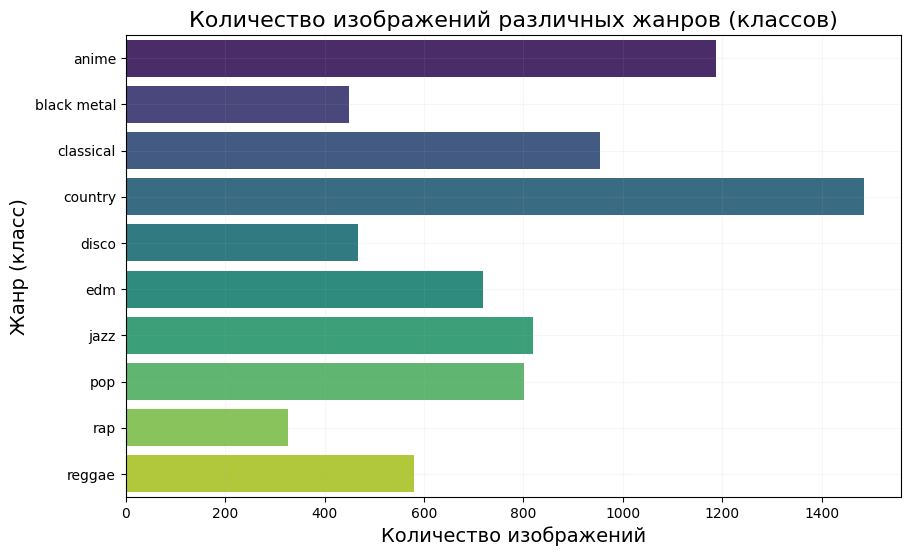

In [23]:
class_names = list(counts.keys())
class_counts = list(counts.values())

plt.figure(figsize=(10, 6))
sns.barplot(x=class_counts, y=class_names, 
            hue=class_names, palette='viridis', legend=False)
plt.xlabel('Количество изображений', fontsize=14)
plt.grid(visible=True, alpha=0.1)
plt.ylabel('Жанр (класс)', fontsize=14)
plt.title('Количество изображений различных жанров (классов)', fontsize=16)
plt.show()

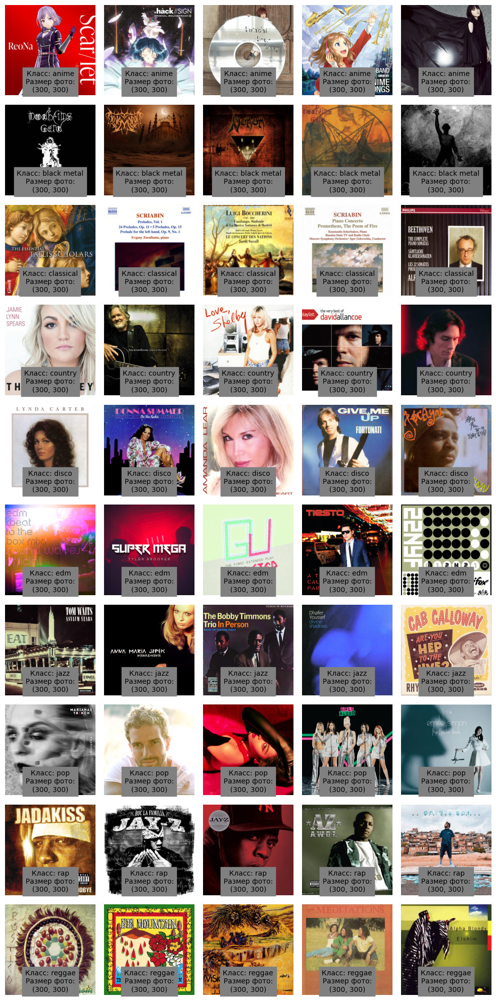

In [24]:
show_qnty = 5
rows = len(counts)
idx = 0
fig, axes = plt.subplots(rows, show_qnty, figsize=(show_qnty*2, rows*2))
for i, item in enumerate(counts.items()):
    random.seed(RANDOM_STATE)
    ids = [random.randint(idx, idx+item[1]) for k in range(show_qnty)]
    idx += item[1]
    for column in range(show_qnty):
        image = Image.open(PATH+images[ids[column]])
        axes[i, column].imshow(image)
        axes[i, column].axis('off')
        axes[i, column].text(
            0.5, 0.15,
            f"Класс: {item[0]}\nРазмер фото:\n{image.size}", 
            fontsize=10,
            color='black',
            transform=axes[i, column].transAxes,
            backgroundcolor='grey',
            ha='center',
            va='center'
        )

plt.tight_layout()
plt.show()

Проверим размеры изображений

In [27]:
def get_image_size(image_path):
    """
    Get the size of an image.

    Parameters:
    - image_path (str): File path to the image.

    Returns:
    - tuple: A tuple containing the width and height of the image.
    """
    with Image.open(PATH+image_path) as img:
        return img.size
    
with Pool() as pool:
    # Map the get_image_size function to the list of image paths to process them in parallel
    sizes = pool.map(get_image_size, images)
    
set(sizes)

{(300, 300)}

#### Вывод по разделу "Загрузка и изучение входных данных"

В ходе изучения входных данных был выполнен анализ каталога с изображениями и выявлено:

1. Имеется 10 классов-жанров музукальных альбомов: 'anime', 'black metal', 'classical', 'country', 'disco', 'edm', 'jazz', 'pop', 'rap', 'reggae'.
2. Общее количество изображений обложек альбомов - 7800.
3. Максимальное количество изображений в классе 'country' (1485, 19.04%), минимальное - 'rap' (327, 4.19%). 
4. Имеется дисбаланс классов. Однако в масштабе общей выборки он не значителен. В рамках работы попробуем его устранить и оценим его влияние на обучение моделей.
5. Изображения, в целом, позволяют различить жанры альбомов человеку. Однако, классы 'country', 'disco' и 'pop' могут иметь схожие цветовые гаммы и трудноразличимы. Класс 'black metal', наверняка, будет различим. Возможно, данный фактор негативно скажется на качестве классификации.
6. Все изображения одного размера - 300x300. Изменения размера на данном этапе не целесообразно.
7. Целесообразно проверить на наличие дубликатов.

### Преобработка данных

#### Поиск и обработка дубликатов

Прозведем предобработку данных на основании ранее сделанных выводов, а именно проверим на наличие дубликатов.

In [28]:
found_duplicates = find_duplicate_images(images)
print("Найденные дубликаты:")
for i, (original, duplicate) in enumerate(found_duplicates):
    print(f"{i + 1}: {(original, duplicate)}"
          f" --> классы: ({idx_to_class[labels[original]]}, "
          f"{idx_to_class[labels[duplicate]]})")

100%|██████████| 7800/7800 [00:12<00:00, 640.93it/s]

Найденные дубликаты:
1: (10, 17) --> классы: (anime, anime)
2: (75, 95) --> классы: (anime, anime)
3: (207, 493) --> классы: (anime, anime)
4: (351, 909) --> классы: (anime, anime)
5: (47, 1052) --> классы: (anime, anime)
6: (1225, 1247) --> классы: (black metal, black metal)
7: (1722, 1948) --> классы: (classical, classical)
8: (1923, 2163) --> классы: (classical, classical)
9: (1879, 2406) --> классы: (classical, classical)
10: (1879, 2591) --> классы: (classical, classical)
11: (3134, 3146) --> классы: (country, country)
12: (2840, 3761) --> классы: (country, country)
13: (3134, 3861) --> классы: (country, country)
14: (4294, 4480) --> классы: (disco, disco)
15: (4211, 4496) --> классы: (disco, disco)
16: (4604, 4616) --> классы: (edm, edm)
17: (4595, 4784) --> классы: (edm, edm)
18: (4589, 4824) --> классы: (edm, edm)
19: (4677, 4905) --> классы: (edm, edm)
20: (4871, 4927) --> классы: (edm, edm)
21: (4653, 4936) --> классы: (edm, edm)
22: (4850, 4947) --> классы: (edm, edm)
23: (4

Обнаружено 52 дубликата. Отобразим те, которые представлены в разных жанрах.

Класс: edm


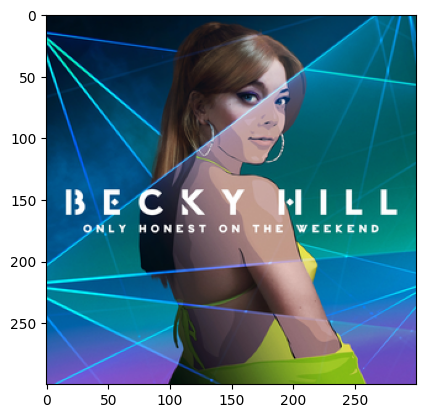

Класс: pop


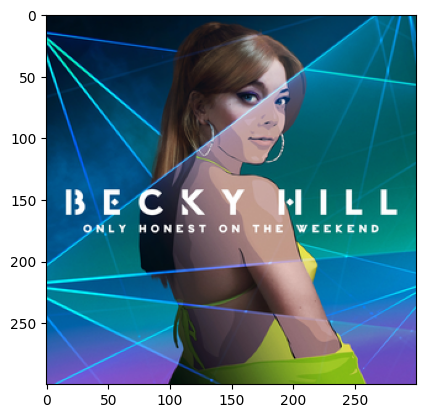

Класс: edm


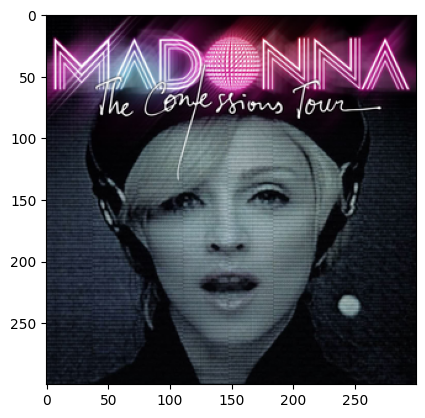

Класс: pop


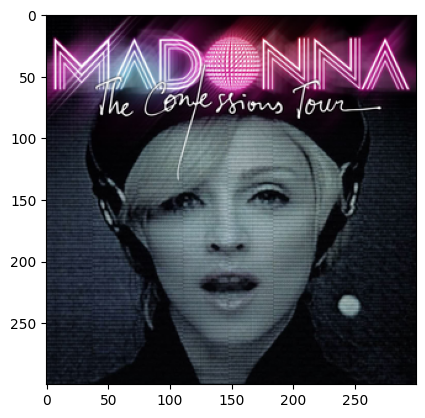

Класс: edm


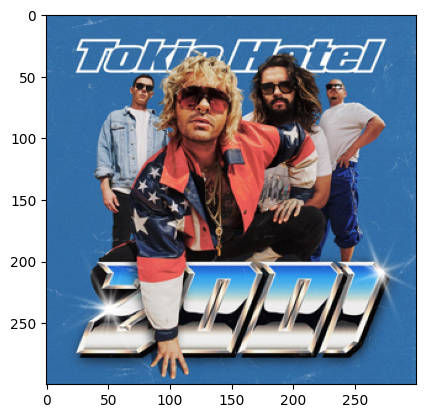

Класс: pop


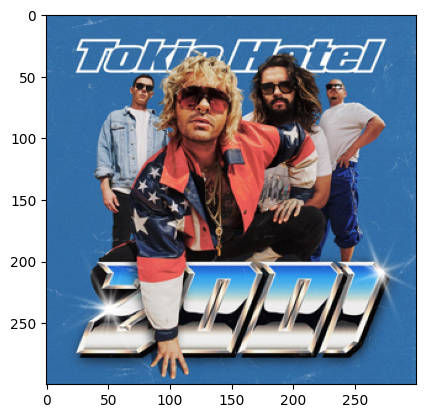

Класс: edm


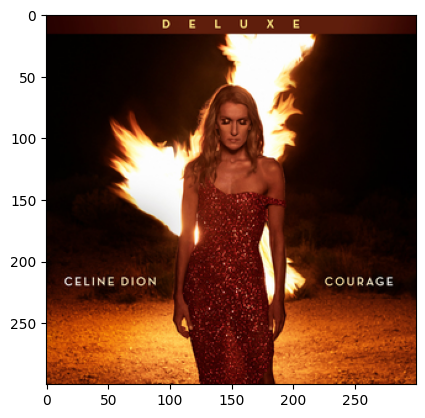

Класс: pop


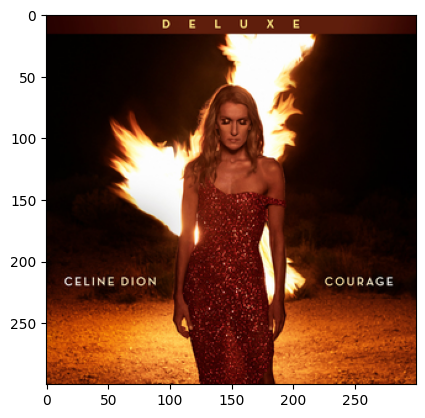

Класс: edm


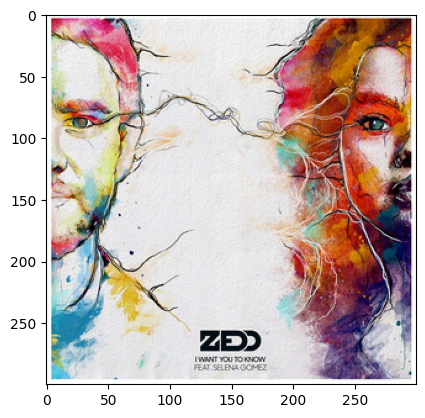

Класс: pop


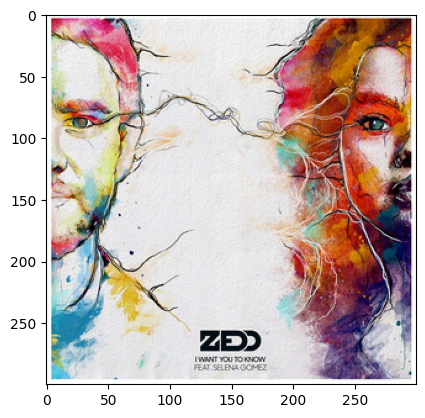

Класс: disco


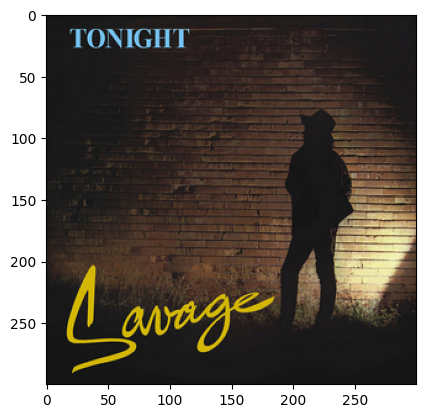

Класс: pop


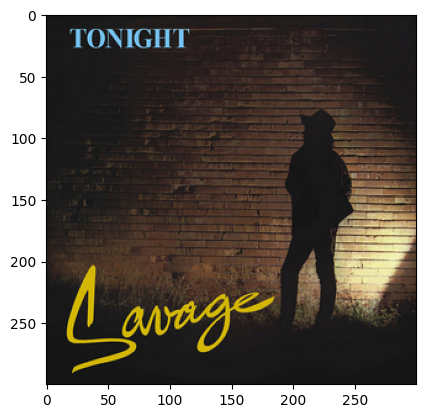

Класс: country


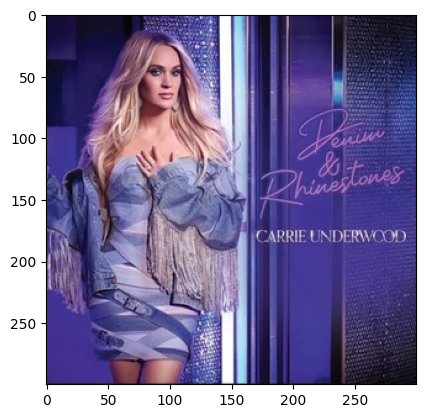

Класс: pop


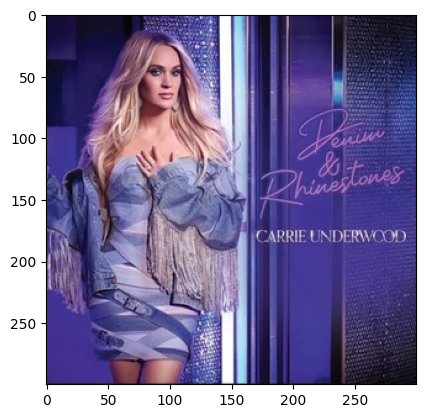

Класс: edm


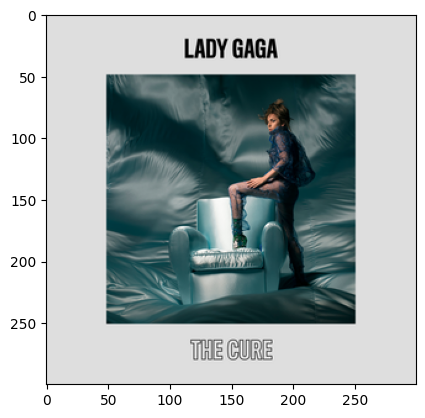

Класс: pop


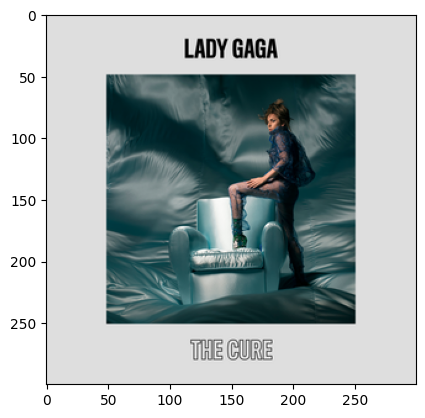

Класс: edm


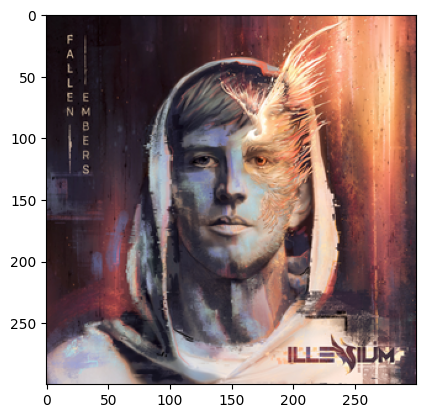

Класс: pop


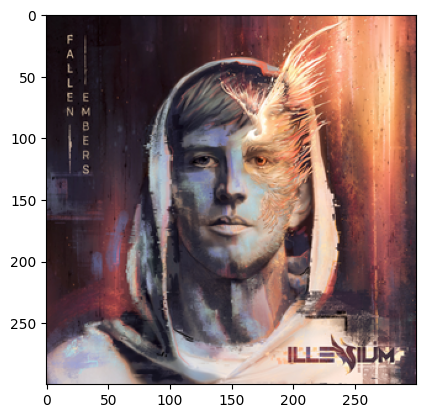

Класс: pop


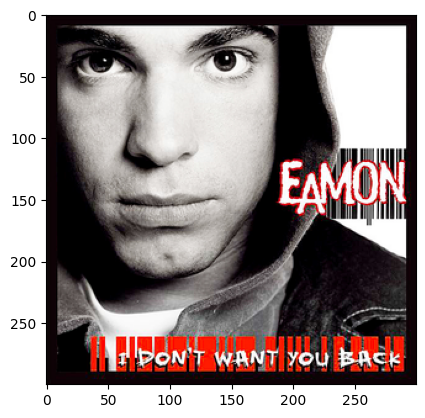

Класс: rap


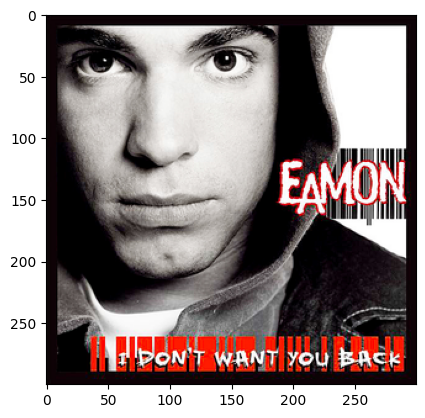

Класс: pop


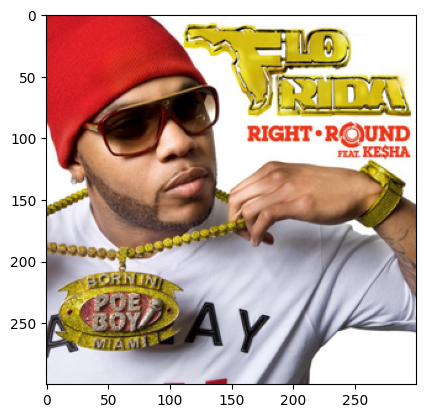

Класс: rap


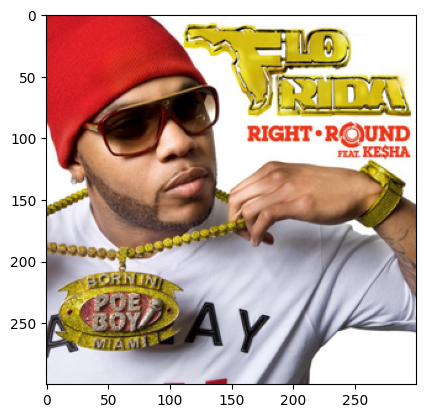

Класс: disco


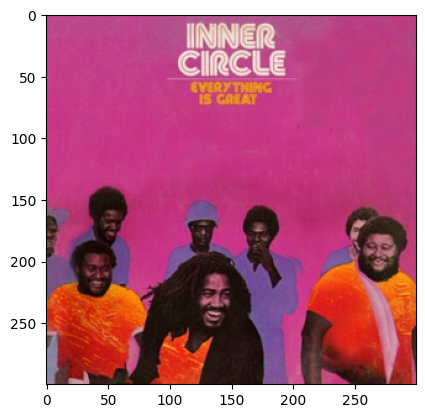

Класс: reggae


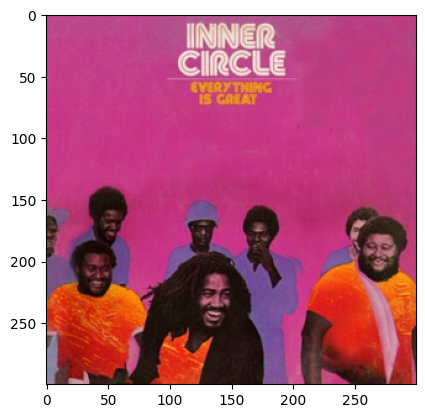

In [29]:
for i, (original, duplicate) in enumerate(found_duplicates):
    class_one = labels[original]
    class_two = labels[duplicate]
    if class_one != class_two:
        for img in (original, duplicate):
            image = Image.open(PATH+images[img])
            print(f"Класс: {idx_to_class[labels[img]]}")
            plt.imshow(image)
            plt.show()

**Дубликаты в разных жанрах** появились вследствие возможной мультижанровости некоторых альбомов. В случае большого количества таких дубликатов может быть целесообразно перейти к мультилейбл классификации. В текущей задаче мультиклассовой классификации удалим дубликаты в рамках предобработки данных.

Однако, **дубликаты в одном жанре** могут быть связаны либо с ошибками сбора данных, либо с выпуском нескольких изданий одного альбома.

В результате сформируем соответствующую функцию предобработки данных.

In [30]:
def preprocessing(
    images: np.ndarray, labels: np.ndarray, idx_to_class: Dict[int, str]
) -> Tuple[np.ndarray, np.ndarray, Dict[int, str]]:
    """
    Preprocess images and labels by removing duplicates and updating 
    class dictionary.

    Parameters:
    - images (np.ndarray): Array of image data.
    - labels (np.ndarray): Array of corresponding labels.
    - idx_to_class (Dict[int, str]): Dictionary mapping label indices 
      to class names.

    Returns:
    - Tuple[np.ndarray, np.ndarray, Dict[int, str]]: A tuple containing 
      preprocessed images, labels, and updated class dictionary.
    """
    
    # Ищем дубликаты
    found_duplicates = find_duplicate_images(images)
    
    # Удаляем все дубликаты по индексам
    ids = [duplicate for _, duplicate in found_duplicates]
    images = np.delete(images, ids)
    labels = np.delete(labels, ids)
        
    # Обновляем словарь классов,  
    # если в классе удалили все изображения
    counts = check_counts(images, labels, idx_to_class)
    check_idx_to_class = idx_to_class.copy()
    for k,v in idx_to_class.items():
        if counts[v] == 927:
            _ = check_idx_to_class.pop(k)
    
    print(f"Удалено {len(found_duplicates)} дубликатов")
    
    return images, labels, check_idx_to_class

#### Вывод по разделу "Предобработка данных"

В ходе предобработки данных были обнаружены 52 дубликата в полном объеме данных. Желательно удалить эти дубликаты. Удалять их будем при формировании данных для обучения с использованием созданной функции.

### Подготовка к моделированию

#### Разделение данных

Разделение данных будем производить по необходимости в зависимости от необходимого объема данных при проведении экспертиментов. Разделение будем осуществять на тренировочную, валидационную и тестовую выборки с учетом дисбаланса классов. Тестовую выборку будем оставлять до окончания работы. Создадим соответствующую функцию.

In [31]:
def split_data(
    images: List[str], 
    labels: List[str], 
    get_valid: bool = True, 
    test_size: float = 0.4
) -> Tuple[List[str], List[str], List[str], List[str], List[str], List[str]]:
    """
    Разделение данных на тренировочную, валидационную и тестовую выборки.

    Parameters:
    - images (List[str]): Список изображений (путей).
    - labels (List[str]): Список меток классов.
    - get_valid (bool): Показатель создания валидационной выборки. 
      По умолчанию - True.
    - test_size (float): Объем тестовой выборки. По умолчанию - 0.4.

    Returns:
    - Tuple: Кортеж, включающий тренировочную, валидационную и тестовую выборки
      Всегда возвращается в последовательности: x, y. Если валидационная 
      выборка не создается, то x_valid и y_valid не возвращается.
      x_train, y_train, [x_valid, y_valid], x_test, y_test
    """
    x_train, x_validtest, y_train, y_validtest = train_test_split(
        images, 
        labels, 
        shuffle=True, 
        stratify=labels, 
        test_size=test_size, 
        random_state=RANDOM_STATE
    )

    if get_valid:
        x_valid, x_test, y_valid, y_test = train_test_split(
            x_validtest, 
            y_validtest, 
            shuffle=True, 
            stratify=y_validtest, 
            test_size=0.5, 
            random_state=RANDOM_STATE)
        
        return x_train, y_train, x_valid, y_valid, x_test, y_test
    
    return x_train, y_train, x_validtest, y_validtest

#### Подготовка датасетов для формирования бейзлайн модели

Создадим класс GenresDataset, предназначенный для загрузки изображений из указанного каталога на основе индексов и соответствующих классов. Реализуем основные методы \_\_init\_\_, \_\_len\_\_ и \_\_getitem\_\_, которые позволят его использовать в качестве набора данных PyTorch.

In [32]:
class GenresDataset(Dataset):
    """
    Класс датасета PyTorch для загрузки изображений из указанного корневого 
    каталога на основе индексов и соответствующих классов.

    Аргументы:
    - indices (list): Список индексов изображений.
    - classes (list): Список меток классов, соответствующих каждому индексу 
      изображения.
    - root_dir (str): Корневой каталог, содержащий изображения.
    - transform (callable, optional): Опциональное преобразование, применяемое 
      к изображениям.

    Методы:
    - __init__(self, indices, classes, root_dir, transform=None): 
      Инициализация датасета с заданными параметрами.
    - __len__(self): Возвращает количество изображений в датасете.
    - __getitem__(self, index): Получение изображения и соответствующей метки 
      класса по указанному индексу.
    """
    def __init__(self, indices, classes, root_dir, transform=None):
        """
        Инициализация датасета с заданными параметрами.

        Параметры:
        - indices (list): Список индексов изображений.
        - classes (list): Список меток классов, соответствующих каждому 
          индексу изображения.
        - root_dir (str): Корневой каталог, содержащий изображения.
        - transform (callable, optional): Опциональное преобразование, 
          применяемое к изображениям.
        """
        self.indices = indices
        self.classes = classes
        self.root_dir = root_dir
        self.transform = transform
    
    def __len__(self):
        """
        Возвращает количество изображений в датасете.
        """
        return len(self.indices)
    
    def __getitem__(self, index):
        """
        Получение изображения и соответствующей метки класса по указанному 
        индексу.

        Параметры:
        - index (int): Индекс изображения для извлечения.

        Возвращает:
        - tuple: Кортеж, содержащий изображение и соответствующую метку класса.
        """
        img_path = os.path.join(self.root_dir, self.indices[index])
        
        with Image.open(img_path) as image:
            image = image.convert("RGB")
        y_label = self.classes[index]
        y_label = torch.as_tensor(y_label, dtype=torch.long)

        if self.transform:
            image = self.transform(image)
        return image, y_label

Определим базовые трансформации изображений, в частности, их преобразование в тензор и нормализацию. В будущем, при необходимости, будем их переопределять. Для изменения размера изображений и их нормализации используем стандартные характеристики для предобученной модели ResNet50.

In [33]:
transform_base = v2.Compose([ 
    v2.Resize((224, 224)),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

#### Формирование эмбеддингов

Формировать эмбеддинги изображений будем с использованием предобученной модели ResNet50 без слоя классификации. Но также предусмотрим возможности использования и других предобученных моделей из пакета PyTorch. Кастомные модели из "файла" добавим позднее. Создадим соответствующую функцию.

In [34]:
def get_embeddings(
    dataset: Any, 
    pretrained_model: str = 'resnet50', 
    batch_size: int = 64
) -> Tuple[np.ndarray, list]:
    """
    Формирование эмбеддингов с использованием предобученой модели. 
    По умолчанию используем ResNet50. При использование иной модели
    рекомендуется пересмотреть трансформации изображений.

    Parameters:
    - dataset (Any): Датасет PyTorch, для данных в котором формируем 
      эмбеддинги.
    - pretrained_model (str): Название предобученной модели в формате PyTorch.
      https://pytorch.org/vision/stable/models.html.
    - batch_size (int): Размер батча.

    Returns:
    - Tuple[np.ndarray, list]: Кортеж, содержащий эмбеддинги и метри классов.
    """
    # Load the pretrained model
    model = torch.hub.load('pytorch/vision', 
                           pretrained_model, 
                           weights='DEFAULT')
    modules = list(model.children())[:-1]
    model = nn.Sequential(*modules)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    # Create a DataLoader for the dataset
    loader = DataLoader(dataset=dataset, 
                        batch_size=batch_size, 
                        shuffle=False, 
                        num_workers=0)
    all_labels = []
    all_embeddings = []

    # Empty the CUDA cache if available
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    # Set the model to evaluation mode
    model.eval()

    # Iterate through the DataLoader
    for data, labels in tqdm(loader):
        new_labels = labels.numpy().tolist()
        all_labels += new_labels
        data = data.to(device)
        embeddings = model(data.to(device))
        all_embeddings.append(np.reshape(
            embeddings.detach().cpu().numpy(), 
            (len(new_labels), -1)
        ))

    # Concatenate all embeddings
    all_embeddings = np.vstack(all_embeddings)

    return all_embeddings, all_labels


#### Вывод по разделу "Подготовка к моделированию"

В ходе подготовки к моделирования были разработаны функции для разделения данных на тренировочную, валидационную и тестовую выборки в соотношении 60%:20%:20% (по умолчанию).

Для загрузки изображений из каталога реализован класс GenresDataset, который в дальнейшем будет использован в качестве набора данных PyTorch.

Кроме того, для построения бейзлайн модели и поиска дубликатов изображений была разработана функция формирования эмбеддингов изображений на основе предобученной модели ResNet50.

## Моделирование

### Определение условий разработки моделей

**Постановка задачи**

Задача моделирования заключается в разработке модели машинного обучения, которая сможет правильно определять жанр музыкального альбома по его обложке. Эта задача может быть сформулирована как задача мультиклассовой классификации.
По условиям задачи все классы одинаково важны, имеется не сильный дисбаланс классов. 

**Выбор метрики**

При выборе метрики для мультиклассовой классификации, где все классы одинаково важны и имеется дисбаланс классов, необходимо учесть не только точность модели, но и её способность правильно классифицировать все классы, в том числе и те, которые могут быть недостаточно представлены в данных. Это связано с тем, что высокая точность предсказаний мажорного класса увеличит точность, а ошибки предсказаний минорного класса окажут слабое негативное влияние на точность.

Учитывая это, одной из подходящих метрик являет F1-мера. F1-мера является гармоническим средним между precision и recall и учитывает как ложно-положительные, так и ложноотрицательные результаты. Наша задача - максимизировать F1-меру, балансируя precision и recall. Кроме того, для оценки производительности модели при дисбалансе классов целесообразно использовать взвешенную F1-меру (weighted F1-score), которая учитывает дисбаланс классов, вычисляя среднее значение F1-меры для каждого класса с учетом их весов или доли в выборке. Это позволит получить более сбалансированную оценку производительности модели.

**Необходимый уровень метрики**

Заказчиком не установлены требования к метрикам. В связи с этим, построим бейзлайн модель для оценки минимального значения метрик.
Кроме того, обратим внимание на наработки специалистов в указанной области, например:

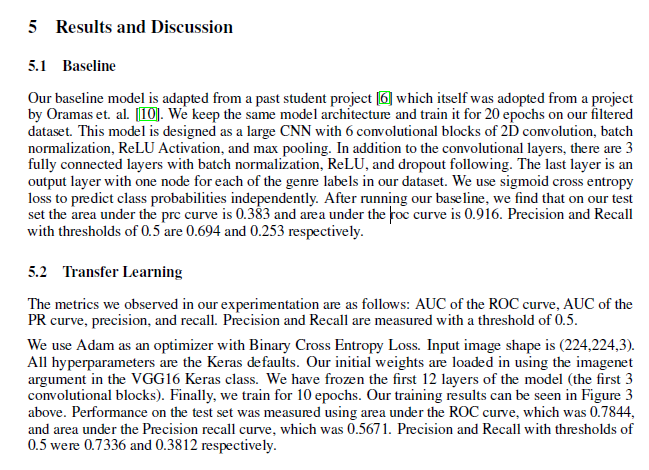
[source](https://cs230.stanford.edu/projects_spring_2020/reports/38953572.pdf)


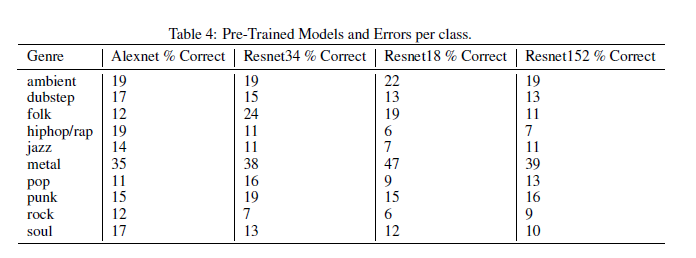
[source](https://rjbaraldi.github.io/assets/websitefiles/paper.pdf)

**План работы**

В соответствии с изложенным, планируется выполнение следующих действий:
1. Формирование бейзлайн модели с использованием метода ближайших соседей.
    - Реализуем такую модель с помощью библиотеки FAISS. Для этого сформируем эмбеддинги изображений, используя предобученную модель, например, ResNet50.
    - Построим FLAT индекс для всех эмбеддингов тренировочной выборки.
    - Сформируем вектор ближайших соседей (5 штук).
    - Сформируем критерий классификации - наиболее встречающийся класс среди соседей. При этом, при равном количестве соседей разных классов, выберем победителем тот, сосед которого ближе к классифицируемому изображению.
2. Сформированные эмбеддинги используем для обучения моделей классического МЛ. Кратко оценим их качество. В завершение моделирования при необходимости полноценно сравним их качество с нейронными сетями (если нейронные сети покажут не самый лучший результат).
3. Построим базовую нейронную сеть, применяя принцип Transfer learning. Используем fine-tuning подход для предобученной модели ResNet50. Вместе с тем, обучим модель с нуля и заморозим слои, кроме последнего.
4. Проведем эксперементы по повышению качества нейронной сети:
    - проведем поиск оптимального гиперпараметра скорость обучения для наших данных;
    - применим несколько вариантов аугментации изображений (в том числе, имплементируем описанный в [статье](https://www.kaggle.com/code/saife245/cutmix-vs-mixup-vs-gridmask-vs-cutout) подход с GridMask);
    - устраним дисбаланс классов (двумя методами: средствами библиотеки PyTorch и копированием данных);
    - Выберем лучший подход.

### Формирование бейзлайн модели

Для формирования бейзлайн модели на FAISS имплементируем выбор классов ближайших соседей на основании данных от FAISS по индексам среди меток класса, а также классификатор на основе ближайших соседей.

In [35]:
def select_neighbours(labels: list, indices: np.ndarray) -> np.ndarray:
    """
    Выбор соседей из списка классов по заданным индексам.

    Parameters:
    - labels (list): Список меток.
    - indices (np.ndarray): Массив индексов.

    Returns:
    - np.ndarray: Выбранные элементы.
    """
    # Преобразуем список labels в массив NumPy
    labels_np = np.array(labels)
    # Выбираем элементы по индексам из массива indices
    selected_elements = labels_np.take(indices)
    return selected_elements

In [36]:
def most_frequent_label(labels: np.ndarray) -> int:
    """
    Находит самую часто встречающуюся метку класса в массиве меток.
    Если несколько меток встречаются одинаково часто, выбирается первая.

    Parameters:
    - labels (np.ndarray): Одномерный массив с метками классов.

    Returns:
    - int: Метка класса, которая встречается чаще всего.
    """
    unique_labels, counts = np.unique(labels, return_counts=True)
    potential_winners = np.argwhere(counts == np.amax(counts)).flatten()
    winners_index = []
    for potential_winner in potential_winners:
        winners_index.append(
            np.where(labels == unique_labels[potential_winner])[0][0]
        )
    nearest_index = np.argmin(np.asarray(winners_index))
    winner = unique_labels[potential_winners[nearest_index]]
    return winner

In [37]:
def get_frequent_labels(labels: np.ndarray) -> np.ndarray:
    """
    Находит самые часто встречающиеся метки классов в массиве меток
    ближайших соседей.

    Parameters:
    - labels (np.ndarray): Двумерный массив с метками классов.

    Returns:
    - np.ndarray: Одномерный массив с метками классов, которые 
      встречается чаще всего.
    """
    return np.asarray([most_frequent_label(label) for label in labels])

Реализуем функцию предсказания с использованием FAISS

In [38]:
def predict_faiss(topn: int, 
                  train_embeddings: np.ndarray, valid_embeddings: np.ndarray,
                  train_labels: np.ndarray, valid_labels: np.ndarray,
                  idx_to_class: dict) -> str:
    """
    Предсказывает классы для валидационного набора данных 
    с использованием FAISS.

    Parameters:
    - topn (int): Количество ближайших соседей для поиска.
    - train_embeddings (np.ndarray): Эмбеддниги тренировочной выборки.
    - valid_embeddings (np.ndarray): Эмбеддниги валидационной выборки.
    - train_labels (np.ndarray): Метки классов тренировочной выборки.
    - valid_labels (np.ndarray): Метки классов валидационной выборки.
    - idx_to_class (dict): Словарь для преобразования индекса класса 
      в наименование класса.

    Returns:
    - str: Отчет о классификации.
    """
    length = len(train_embeddings[0])
    index = faiss.IndexFlatL2(length)
    index.add(train_embeddings)

    val_distances, val_indices = index.search(valid_embeddings, topn)

    pred_labels = select_neighbours(train_labels, val_indices)
    pred_labels = get_frequent_labels(pred_labels)

    report = classification_report(valid_labels, 
                                   pred_labels, 
                                   target_names=idx_to_class.values())
    return report

#### Тестирование бейзлайн модели (два класса)

Для предварительной оценки рабоспособности подхода и планируемой бейзлайн модели сформируем ее для 50% изображений двух равнозначных классов, например, 'anime' и 'country'. Для этого сформируем "урезанные" датасеты.

In [39]:
images, labels, idx_to_class = get_data(
    PATH,
    rate=0.5,
    use_classes=['country', 'anime']
)

In [40]:
images, labels, idx_to_class = preprocessing(
    images, labels, idx_to_class
)

100%|██████████| 1337/1337 [00:02<00:00, 650.30it/s]

Удалено 1 дубликатов


In [41]:
counts = check_counts(images, labels, idx_to_class)
counts

{'anime': 592, 'country': 742}

In [42]:
[print(f"Доля изображений класса '{x}': "
       f"{round(y/len(images)*100, 2)}%") for x, y in counts.items()];

Доля изображений класса 'anime': 44.31%
Доля изображений класса 'country': 55.54%


Разделим данные на тренировочную и валидационную выборки

In [43]:
x_train, y_train, x_valid, y_valid = split_data(images, labels, 
                                                get_valid=False)

print(f"Тренировочная выборка: изображений {len(x_train)}, "
      f"меток классов: {len(y_train)}")
print(f"Валидационная выборка: изображений {len(x_valid)}, "
      f"меток классов: {len(y_valid)}")

Тренировочная выборка: изображений 801, меток классов: 801
Валидационная выборка: изображений 535, меток классов: 535


Сформируем датасеты для формирования эмбеддингов

In [44]:
trainset = GenresDataset(indices=x_train, 
                               classes=y_train,
                               root_dir=PATH,
                               transform=transform_base)

validset = GenresDataset(indices=x_valid, 
                               classes=y_valid,
                               root_dir=PATH,
                               transform=transform_base)

print(f"Размер датасета для трейна: {len(trainset)}")
print(f"Размер датасета для валидации: {len(validset)}")

Размер датасета для трейна: 801
Размер датасета для валидации: 535


Сформируем эмбеддинги

In [45]:
train_embeddings, train_labels = get_embeddings(trainset, batch_size=32)
valid_embeddings, valid_labels = get_embeddings(validset, batch_size=32)
print("Размерность эмбеддингов:", train_embeddings.shape)

Downloading: "https://github.com/pytorch/vision/zipball/main" to /root/.cache/torch/hub/main.zip
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 159MB/s]
100%|██████████| 26/26 [00:08<00:00,  3.08it/s]
Using cache found in /root/.cache/torch/hub/pytorch_vision_main
100%|██████████| 17/17 [00:05<00:00,  3.35it/s]

Размерность эмбеддингов: (801, 2048)


Осуществим предсказание с использованием нашего классификатора на FAISS

In [46]:
print(predict_faiss(5, train_embeddings, valid_embeddings,
                    train_labels, valid_labels,
                    idx_to_class))

              precision    recall  f1-score   support

       anime       0.88      0.89      0.88       237
     country       0.91      0.90      0.91       298

    accuracy                           0.90       535
   macro avg       0.89      0.89      0.89       535
weighted avg       0.90      0.90      0.90       535



**Промежуточный вывод**



Результаты "обучения" простого бинарного классификатора показывают хорошую метрику Weighted F1 - 0,90. Модель работает. Обобщим ее на весь дата-сет.

#### Бейзлайн модель для всего дата-сета

Для построения бейзлайн модели используем полные датасеты.

In [47]:
images, labels, idx_to_class = get_data(PATH)

In [48]:
images, labels, idx_to_class = preprocessing(images, labels, idx_to_class)

100%|██████████| 7800/7800 [00:12<00:00, 648.81it/s]

Удалено 52 дубликатов


In [49]:
counts = check_counts(images, labels, idx_to_class)
counts

{'anime': 1183,
 'black metal': 448,
 'classical': 950,
 'country': 1482,
 'disco': 465,
 'edm': 701,
 'jazz': 818,
 'pop': 789,
 'rap': 325,
 'reggae': 577}

In [50]:
[print(f"Доля изображений класса '{x}': "
       f"{round(y/len(images)*100, 2)}%") for x, y in counts.items()];

Доля изображений класса 'anime': 15.27%
Доля изображений класса 'black metal': 5.78%
Доля изображений класса 'classical': 12.26%
Доля изображений класса 'country': 19.13%
Доля изображений класса 'disco': 6.0%
Доля изображений класса 'edm': 9.05%
Доля изображений класса 'jazz': 10.56%
Доля изображений класса 'pop': 10.18%
Доля изображений класса 'rap': 4.19%
Доля изображений класса 'reggae': 7.45%


In [51]:
x_train, y_train, x_valid, y_valid, x_test, y_test = split_data(images, labels, 
                                                get_valid=True)

print(f"Тренировочная выборка: изображений {len(x_train)}, "
      f"меток классов: {len(y_train)}")
print(f"Валидационная выборка: изображений {len(x_valid)}, "
      f"меток классов: {len(y_valid)}")
print(f"Тестовая выборка: изображений {len(x_test)}, "
      f"меток классов: {len(y_test)}")

Тренировочная выборка: изображений 4648, меток классов: 4648
Валидационная выборка: изображений 1550, меток классов: 1550
Тестовая выборка: изображений 1550, меток классов: 1550


In [52]:
trainset = GenresDataset(indices=x_train, 
                               classes=y_train,
                               root_dir=PATH,
                               transform=transform_base)

validset = GenresDataset(indices=x_valid, 
                               classes=y_valid,
                               root_dir=PATH,
                               transform=transform_base)

print(f"Размер датасета для трейна: {len(trainset)}")
print(f"Размер датасета для валидации: {len(validset)}")

Размер датасета для трейна: 4648
Размер датасета для валидации: 1550


In [53]:
train_embeddings, train_labels = get_embeddings(trainset, 'resnet50')
valid_embeddings, valid_labels = get_embeddings(validset, 'resnet50')
print("Размерность эмбеддингов:", train_embeddings.shape)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main
100%|██████████| 73/73 [00:44<00:00,  1.65it/s]
Using cache found in /root/.cache/torch/hub/pytorch_vision_main
100%|██████████| 25/25 [00:15<00:00,  1.64it/s]

Размерность эмбеддингов: (4648, 2048)


Сохраним полученные эмбеддинги в файлах __*.npy__

Создадим функцию создания папки для эмбеддингов

In [54]:
def create_dir(initial_content: Dict[str, Any], type: str) -> str:
    """
    Create a directory for saving results and save a dictionary with 
    initialization data into the created directory.

    Parameters
    ----------
    initial_content : Dict[str, Any]
        A dictionary containing data to be saved.
    type : str
        The type of content being saved.

    Returns
    -------
    str
        The path to the created directory.
    """
    dirname = (
        f"/kaggle/working/{type}/"
        f"{datetime.datetime.now().strftime('%m_%d_%y_%H_%M_%S')}/"
    )
    os.makedirs(os.path.dirname(dirname), exist_ok=True)
    torch.save(initial_content, f'{dirname}initial_content.pth')
    return dirname


In [55]:
content = {
    'train_embeddings': train_embeddings, 
    'train_labels': train_labels,
    'valid_embeddings': valid_embeddings, 
    'valid_labels': valid_labels
}
create_dir(content, type='embeddings')

'/kaggle/working/embeddings/05_02_24_03_10_48/'

Осуществим предсказания

In [56]:
print(predict_faiss(5, train_embeddings, valid_embeddings,
                   train_labels, valid_labels,
                   idx_to_class))

              precision    recall  f1-score   support

       anime       0.62      0.72      0.67       237
 black metal       0.68      0.64      0.66        90
   classical       0.50      0.66      0.57       191
     country       0.55      0.56      0.56       297
       disco       0.20      0.13      0.16        93
         edm       0.60      0.37      0.46       140
        jazz       0.38      0.46      0.41       164
         pop       0.37      0.31      0.34       158
         rap       0.62      0.38      0.48        65
      reggae       0.36      0.37      0.36       115

    accuracy                           0.50      1550
   macro avg       0.49      0.46      0.47      1550
weighted avg       0.50      0.50      0.49      1550



**Промежуточный вывод**



Результаты "обучения" низки. Метрика Weighted F1 - 0.49. Надеемся, что иные модели дадут лучший результат.

#### Классический МЛ - SVC

Для построения бейзлайн модели используем полные датасеты.

In [57]:
model_svc = SVC()

In [58]:
model_svc.fit(train_embeddings, train_labels)

SVC()

In [59]:
pred_svc = model_svc.predict(valid_embeddings)

In [60]:
print(classification_report(valid_labels, pred_svc, target_names=idx_to_class.values()))

              precision    recall  f1-score   support

       anime       0.73      0.87      0.79       237
 black metal       0.81      0.92      0.86        90
   classical       0.79      0.74      0.76       191
     country       0.61      0.73      0.67       297
       disco       0.33      0.15      0.21        93
         edm       0.54      0.61      0.57       140
        jazz       0.58      0.45      0.51       164
         pop       0.50      0.53      0.51       158
         rap       0.57      0.40      0.47        65
      reggae       0.62      0.50      0.56       115

    accuracy                           0.64      1550
   macro avg       0.61      0.59      0.59      1550
weighted avg       0.62      0.64      0.62      1550



#### Классический МЛ - RandomForestClassifier

In [61]:
model_rfc = RandomForestClassifier()

In [62]:
model_rfc.fit(train_embeddings, train_labels)

RandomForestClassifier()

In [63]:
pred_rfc = model_rfc.predict(valid_embeddings)

In [64]:
print(classification_report(valid_labels, pred_rfc, target_names=idx_to_class.values()))

              precision    recall  f1-score   support

       anime       0.54      0.81      0.65       237
 black metal       0.68      0.70      0.69        90
   classical       0.60      0.59      0.59       191
     country       0.42      0.76      0.54       297
       disco       0.00      0.00      0.00        93
         edm       0.52      0.51      0.52       140
        jazz       0.46      0.23      0.31       164
         pop       0.38      0.26      0.31       158
         rap       0.75      0.05      0.09        65
      reggae       0.47      0.16      0.24       115

    accuracy                           0.49      1550
   macro avg       0.48      0.41      0.39      1550
weighted avg       0.48      0.49      0.45      1550



#### Классический МЛ - CatBoostClassifier

Для построения бейзлайн модели используем полные датасеты.

In [65]:
model_cbc = CatBoostClassifier(verbose=100, 
                               n_estimators=1000,
                               random_seed=RANDOM_STATE, 
                               task_type='GPU')

In [66]:
model_cbc.fit(train_embeddings, train_labels)

Learning rate set to 0.088799
0:	learn: 2.2031269	total: 19.8s	remaining: 5h 28m 51s
100:	learn: 1.0000606	total: 23.8s	remaining: 3m 32s
200:	learn: 0.7501384	total: 27.6s	remaining: 1m 49s
300:	learn: 0.6023596	total: 31.4s	remaining: 1m 12s
400:	learn: 0.4986160	total: 35s	remaining: 52.3s
500:	learn: 0.4216413	total: 38.6s	remaining: 38.5s
600:	learn: 0.3618028	total: 42.2s	remaining: 28s
700:	learn: 0.3165451	total: 45.8s	remaining: 19.5s
800:	learn: 0.2758505	total: 49.3s	remaining: 12.3s
900:	learn: 0.2436678	total: 52.9s	remaining: 5.81s
999:	learn: 0.2148480	total: 56.4s	remaining: 0us


In [67]:
pred_cbc = model_cbc.predict(valid_embeddings)

In [68]:
print(classification_report(valid_labels, pred_cbc, target_names=idx_to_class.values()))

              precision    recall  f1-score   support

       anime       0.70      0.86      0.77       237
 black metal       0.80      0.90      0.85        90
   classical       0.74      0.70      0.72       191
     country       0.59      0.71      0.64       297
       disco       0.49      0.18      0.27        93
         edm       0.54      0.61      0.57       140
        jazz       0.56      0.45      0.50       164
         pop       0.45      0.44      0.45       158
         rap       0.74      0.45      0.56        65
      reggae       0.59      0.51      0.55       115

    accuracy                           0.62      1550
   macro avg       0.62      0.58      0.59      1550
weighted avg       0.61      0.62      0.61      1550



#### Вывод по разделу "Формирование бейзлайн модели"

В результате работы получена бейз-лайн модель, которая показала минимальный уровень качества разрабатываемых моделей (метрика Weight F1 равна 0,49). Модели классического МЛ показали результаты лучше (метрика Weight F1 равна 0,62 для модели SVC). Полноценный анализ их работы проведем после формирования нейросети.

### Формирование нейросети

Сформируем функции для обучения нейросети на заданное количество эпох с выводом графиков лосса и оцениваемых метрик, тестрирования качества нейросети на каждой эпохе обучения на валидационной выборке.

In [69]:
def train(
    model: torch.nn.Module, 
    trainloader: DataLoader, 
    criterion: torch.nn.Module, 
    optimizer: torch.optim.Optimizer, 
    device: torch.device
) -> Tuple[torch.nn.Module, float, float, float, float]:
    """
    Обучение модели на тренировочных данных.

    Параметры
    ----------
    model : torch.nn.Module
        Модель для обучения.
    trainloader : DataLoader
        DataLoader для тренировочных данных.
    criterion : torch.nn.Module
        Функция потерь для расчета ошибки.
    optimizer : torch.optim.Optimizer
        Оптимизатор для обновления весов модели.
    device : torch.device
        Устройство (CPU или GPU), на котором происходит обучение.

    Возвращает
    -------
    Tuple[torch.nn.Module, float, float, float, float]
        Кортеж, содержащий модель, среднее значение функции 
        потерь на тренировочных данных, точность на тренировочных данных, 
        взвешенную F1-метрику и PRC-AUC.

    """
    train_loss = 0.0
    train_total = 0
    train_correct = 0
    
    # Переменные для хранения предсказаний и меток
    all_predictions = np.empty(0)
    all_labels = np.empty(0)

    # Переключение на режим обучения
    model.train()

    for inputs, labels in tqdm(trainloader):
        labels = labels.type(torch.LongTensor)
        inputs, labels = inputs.to(device), labels.to(device)

        # Обнуление градиентов параметров
        optimizer.zero_grad()

        # Прямой проход
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        # Обратный проход и оптимизация
        loss.backward()
        optimizer.step()

        # Обновление функции потерь на тренировочных данных
        train_loss += loss.item() * inputs.size(0)

        # Вычисление предсказаний и обновление списка предсказаний и меток
        _, predicted = torch.max(outputs, 1)
        train_total += labels.size(0)
        train_correct += (predicted == labels).sum().item()
        all_predictions = np.append(all_predictions, predicted.cpu().numpy())
        all_labels = np.append(all_labels, labels.cpu().numpy())

    # Вычисление средней функции потерь и точности на тренировочных данных
    train_loss = train_loss / len(trainloader.dataset)
    train_accuracy = 100.0 * train_correct / train_total
        
    # Расчет взвешенной F1-метрики
    weighted_f1_score = f1_score(all_labels, 
                                 all_predictions, 
                                 average='weighted')
    result = (
        model, 
        train_loss, 
        train_accuracy, 
        weighted_f1_score, 
    )
    
    return result


In [70]:
def test(model: torch.nn.Module, 
         testloader: DataLoader, 
         criterion: torch.nn.Module, 
         device: torch.device) -> Tuple[float, float, float]:
    """
    Функция для тестирования модели на тестовом наборе данных.

    Parameters
    ----------
    model : torch.nn.Module
        Модель, которую необходимо протестировать.
    testloader : DataLoader
        DataLoader для тестового набора данных.
    criterion : torch.nn.Module
        Функция потерь для оценки производительности модели.
    device : torch.device
        Устройство (GPU или CPU), на котором выполняется тестирование.
        
    Returns
    -------
    result : Tuple[float, float, float]
        Кортеж, содержащий результаты тестирования:
            - test_loss (float): Среднее значение функции потерь 
              на тестовом наборе данных.
            - test_accuracy (float): Процент правильно 
              классифицированных примеров.
            - weighted_f1_score (float): Взвешенная F1-метрика.
    """
    test_loss = 0.0
    test_total = 0
    test_correct = 0

    # Переменные для хранения предсказаний и меток
    all_predictions = np.empty(0)
    all_labels = np.empty(0)
    
    # Switch to evaluation mode
    model.eval()

    with torch.no_grad():
        for inputs, labels in tqdm(testloader):
            labels = labels.type(torch.LongTensor)
            inputs, labels = inputs.to(device), labels.to(device)

            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            # Update test loss
            test_loss += loss.item() * inputs.size(0)

            # Compute test accuracy
            _, predicted = torch.max(outputs, 1)
            test_total += labels.size(0)
            test_correct += (predicted == labels).sum().item()
            all_predictions = np.append(all_predictions, 
                                        predicted.cpu().numpy())
            all_labels = np.append(all_labels, labels.cpu().numpy())

    # Compute average test loss and accuracy
    test_loss = test_loss / len(testloader.dataset)
    test_accuracy = 100.0 * test_correct / test_total
    # Расчет взвешенной F1-метрики
    weighted_f1_score = f1_score(all_labels, 
                                 all_predictions, 
                                 average='weighted')
    
    result = (
        test_loss, 
        test_accuracy,
        weighted_f1_score, 
    )

    return result

In [71]:
def train_epochs(
    model: torch.nn.Module,
    trainloader: DataLoader,
    testloader: DataLoader,
    criterion: torch.nn.Module,
    optimizer: torch.optim.Optimizer,
    device: torch.device,
    num_epochs: int,
    early_stopping_patience: int = 2,
    path: str = '/kaggle/working/'
) -> Tuple[
    torch.nn.Module, 
    list, list, list, 
    list, list, list
]:
    """
    Обучает модель несколько эпох.

    Parameters
    ----------
    model : torch.nn.Module
        Модель для обучения.
    trainloader : DataLoader
        DataLoader для тренировочных данных.
    testloader : DataLoader
        DataLoader для валидационных данных.
    criterion : torch.nn.Module
        Функция потерь для расчета ошибки.
    optimizer : torch.optim.Optimizer
        Оптимизатор для обновления весов модели.
    device : torch.device
        Устройство (CPU или GPU), на котором происходит обучение.
    num_epochs : int
        Количество эпох обучения.
    early_stopping_patience : int, optional
        Параметр ранней остановки, по умолчанию 2.
    path : str, optional
        Путь для сохранения модели и переменных, по умолчанию 
        '/kaggle/working/'.

    Returns
    -------
    Tuple[torch.nn.Module, list, list, list, list, list, list]
        Кортеж, содержащий обученную модель, списки функций потерь, 
        точности и взвешенных F1-метрик для тренировочных и 
        валидационных данных.
    """
    train_losses = []
    train_accuracies = []
    train_f1s = []
    test_losses = []
    test_accuracies = []
    test_f1s = []
    best_f1_score = 0.0
    best_f1_epoch = 0
    patience_counter = 0
    
    print(f"The path is {path}")

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        model, train_loss, train_accuracy, \
        train_weighted_f1_score = train(
            model, 
            trainloader, 
            criterion, 
            optimizer, 
            device
        )
        test_loss, test_accuracy, \
        test_weighted_f1_score = test(
            model, 
            testloader, 
            criterion,
            device
        )

        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        train_f1s.append(train_weighted_f1_score)
        test_losses.append(test_loss)
        test_accuracies.append(test_accuracy)
        test_f1s.append(test_weighted_f1_score)

        print(f"Train Loss: {train_loss:.4f} - "
              f"Train Accuracy: {train_accuracy:.2f}% - "
              f"Train F1: {train_weighted_f1_score:.4f}")
        print(f"Valid Loss: {test_loss:.4f} - "
              f"Valid Accuracy: {test_accuracy:.2f}% - "
              f"Valid F1: {test_weighted_f1_score:.4f}")
        print()

        # Save the model and variables
        torch.save(
            model.state_dict(), 
            (
                f"{path}model_epoch_{epoch+1}_"
                f"{test_weighted_f1_score:.4f}.pth"
                )
            )                  
        checkpoint = {
            'epoch': epoch + 1,
            'train_losses': train_losses,
            'train_accuracies': train_accuracies,
            'train_f1s': train_f1s,
            'test_losses': test_losses,
            'test_accuracies': test_accuracies,
            'test_f1s': test_f1s,
        }
        torch.save(
            checkpoint, 
            f'{path}variables_epoch_{epoch+1}_{test_weighted_f1_score:.4f}.pth'
        )

        # Проверка на улучшение взвешенной F1-метрики для ранней остановки
        if test_weighted_f1_score > best_f1_score:
            best_f1_score = test_weighted_f1_score
            best_f1_epoch = epoch+1
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= early_stopping_patience:
                print(f"Early stopping triggered: no improvement "
                f"in test F1 score for", early_stopping_patience, "epochs.")
                print(f"The best epoch is #{best_f1_epoch}")
                
                
                # Получение списка всех файлов в директории
                files = os.listdir(path)
                # Определение имени файла лучшей модели
                best_model_filename = (
                    f"model_epoch_{best_f1_epoch}_{best_f1_score:.4f}.pth"
                )
                best_variables_filename = (
                    f"variables_epoch_{best_f1_epoch}_{best_f1_score:.4f}.pth"
                )
                
                # Проход по всем файлам в директории
                for file in files:
                    # Если файл не является файлом лучшей 
                    # модели и имеет нужное имя формата
                    if (file != best_model_filename 
                        and file.startswith("model_epoch_") 
                        and file.endswith(".pth")):
                        # Формирование пути к файлу
                        file_path = os.path.join(path, file)
                        # Удаление файла
                        os.remove(file_path)
                    if (file != best_variables_filename 
                        and file.startswith("variables_epoch_") 
                        and file.endswith(".pth")):
                        # Формирование пути к файлу
                        file_path = os.path.join(path, file)
                        # Удаление файла
                        os.remove(file_path)
                
                print(f"The best model is saved")
                print(f"The best weighed F1 score equals {best_f1_score}")
                break

    result = (
        model,
        train_losses, 
        train_accuracies, 
        train_f1s, 
        test_losses, 
        test_accuracies, 
        test_f1s
    )
    
    return result

In [72]:
def plot_loss(train_losses: List[float], test_losses: List[float]) -> None:
    """
    Строит график функции потерь для тренировочных и валидационных данных.

    Parameters
    ----------
    train_losses : List[float]
        Список значений функции потерь для тренировочных данных.
    test_losses : List[float]
        Список значений функции потерь для валидационных данных.

    Returns
    -------
    None
        Функция отображает график функции потерь и сохраняет 
        его как 'loss_plot.png'.
    """
    plt.figure()
    plt.plot(range(len(train_losses)), train_losses, label='Training Loss')
    plt.plot(range(len(test_losses)), test_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.savefig('loss_plot.png')
    plt.show()

In [73]:
def plot_metrics(train_metrics: List[float], 
                 test_metrics: List[float], 
                 metric_name: str) -> None:
    """
    Строит график метрики для тренировочных и валидационных данных.

    Parameters
    ----------
    train_metrics : List[float]
        Список значений метрики для тренировочных данных.
    test_metrics : List[float]
        Список значений метрики для валидационных данных.
    metric_name : str
        Название метрики.

    Returns
    -------
    None
        Функция отображает график метрики и сохраняет 
        его как '{metric_name}_plot.png'.
    """
    plt.figure()
    plt.plot(range(len(train_metrics)), 
             train_metrics, 
             label=f"Training {metric_name}")
    plt.plot(range(len(test_metrics)),
             test_metrics, 
             label=f"Validation {metric_name}")
    plt.xlabel('Epoch')
    plt.ylabel(metric_name)
    plt.legend()
    plt.savefig(f"{metric_name}_plot.png")
    plt.show()

#### Тестирование нейросети (два класса)

Подготовка основных данных

Для предварительной оценки рабоспособности подхода и нейросети сформируем ее для 50% изображений двух равнозначных классов, например, 'anime' и 'country'. Для этого сформируем "урезанные" датасеты.

In [74]:
images, labels, idx_to_class = get_data(
    PATH,
    rate=0.5,
    use_classes=['country', 'anime']
)

In [75]:
images, labels, idx_to_class = preprocessing(
    images, labels, idx_to_class
)

100%|██████████| 1337/1337 [00:02<00:00, 615.76it/s]

Удалено 1 дубликатов


In [76]:
counts = check_counts(images, labels, idx_to_class)
counts

{'anime': 592, 'country': 742}

In [77]:
[print(f"Доля изображений класса '{x}': "
       f"{round(y/len(images)*100, 2)}%") for x, y in counts.items()];
num_classes = len(list(idx_to_class.values()))

Доля изображений класса 'anime': 44.31%
Доля изображений класса 'country': 55.54%


Разделим данные на тренировочную и валидационную выборки

In [78]:
x_train, y_train, x_valid, y_valid = split_data(images, labels, 
                                                get_valid=False)

print(f"Тренировочная выборка: изображений {len(x_train)}, "
      f"меток классов: {len(y_train)}")
print(f"Валидационная выборка: изображений {len(x_valid)}, "
      f"меток классов: {len(y_valid)}")

Тренировочная выборка: изображений 801, меток классов: 801
Валидационная выборка: изображений 535, меток классов: 535


Сформируем датасеты с базовой трансформацией

In [79]:
trainset = GenresDataset(indices=x_train, 
                         classes=y_train,
                         root_dir=PATH,
                         transform=transform_base)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                      shuffle=True, num_workers=4)

validset = GenresDataset(indices=x_valid, 
                         classes=y_valid,
                         root_dir=PATH,
                         transform=transform_base)
validloader = torch.utils.data.DataLoader(validset, batch_size=128,
                                          shuffle=True, num_workers=4)

print(f"Размер датасета для трейна: {len(trainset)}")
print(f"Размер датасета для валидации: {len(validset)}")

Размер датасета для трейна: 801
Размер датасета для валидации: 535


Зафиксируем условия эксперимента

In [78]:
experimet_description = {
    'trainloader': trainloader, 
    'validloader': validloader,
    'descrition': 'Бинарная классификация. Anime и Country, 30%',
    'criterion': 'nn.CrossEntropyLoss()',
    'optimizer': 'optim.Adam(model.parameters(), lr=0.005)',
    'model': "torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')",
    'model.fc': 'nn.Linear(num_features, num_classes)',
    'transform': transform_base,
}
dirname = create_dir(content, type='nn')

Сформируем модель

In [79]:
model = torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, num_classes)
for param in model.parameters():
    param.requires_grad = False
for param in model.fc.parameters():
    param.requires_grad = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.005)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


In [80]:
%%time

num_epochs = 200
model, \
train_losses, train_accuracies, train_f1s, \
test_losses, test_accuracies, test_f1s = train_epochs(
    model, 
    trainloader, 
    validloader, 
    criterion, 
    optimizer, 
    device,
    num_epochs,
    early_stopping_patience=5,
    path=dirname
)

The path is /kaggle/working/nn/04_30_24_22_53_48/
Epoch 1/200


100%|██████████| 5/5 [00:02<00:00,  1.85it/s]


Train Loss: 0.4715 - Train Accuracy: 76.40% - Train F1: 0.7623
Valid Loss: 0.2492 - Valid Accuracy: 90.65% - Valid F1: 0.9052

Epoch 2/200


100%|██████████| 5/5 [00:02<00:00,  1.92it/s]


Train Loss: 0.2110 - Train Accuracy: 93.38% - Train F1: 0.9337
Valid Loss: 0.1950 - Valid Accuracy: 92.52% - Valid F1: 0.9252

Epoch 3/200


100%|██████████| 5/5 [00:02<00:00,  1.90it/s]


Train Loss: 0.1452 - Train Accuracy: 95.51% - Train F1: 0.9550
Valid Loss: 0.1911 - Valid Accuracy: 91.78% - Valid F1: 0.9176

Epoch 4/200


100%|██████████| 5/5 [00:02<00:00,  1.83it/s]


Train Loss: 0.1133 - Train Accuracy: 97.00% - Train F1: 0.9701
Valid Loss: 0.1883 - Valid Accuracy: 91.40% - Valid F1: 0.9141

Epoch 5/200


100%|██████████| 5/5 [00:02<00:00,  1.92it/s]


Train Loss: 0.0923 - Train Accuracy: 97.75% - Train F1: 0.9775
Valid Loss: 0.1964 - Valid Accuracy: 91.21% - Valid F1: 0.9118

Epoch 6/200


100%|██████████| 5/5 [00:02<00:00,  1.92it/s]


Train Loss: 0.0730 - Train Accuracy: 98.38% - Train F1: 0.9838
Valid Loss: 0.1940 - Valid Accuracy: 91.21% - Valid F1: 0.9123

Epoch 7/200


100%|██████████| 5/5 [00:02<00:00,  1.85it/s]


Train Loss: 0.0658 - Train Accuracy: 99.00% - Train F1: 0.9900
Valid Loss: 0.1978 - Valid Accuracy: 89.91% - Valid F1: 0.8989

Early stopping triggered: no improvement in test F1 score for 5 epochs.
The best epoch is #2
The best model is saved
The best weighed F1 score equals 0.9252336448598131
CPU times: user 15.9 s, sys: 3.5 s, total: 19.4 s
Wall time: 45.8 s


**Промежуточный вывод**

В результате обучения нейросеть показала лучше бейз-лайн модели для аналогичных данных.

#### Поиск скорости обучения

Попробуем подобрать скорость обучения, используя библиотеку lr_finder 

Переобучим модель

**Промежуточный вывод**

Найденная скорость обучения показывает хорошие результаты, достижимые меньшим количеством эпох обучения. После эксперементов выполним поиск оптимального значения.

#### Нейросеть для всего датасета

Для построения основной модели используем полный датасет.

In [80]:
rate = 1.
use_classes=None

images, labels, idx_to_class = get_data(PATH)
images, labels, idx_to_class = preprocessing(images, 
                                             labels,
                                             idx_to_class)
num_classes = len(list(idx_to_class.values()))
X, y, X_test, y_test = split_data(images, 
                                  labels,
                                  get_valid=False,
                                  test_size=0.2)

In [114]:
testset = GenresDataset(indices=X_test,
                        classes=y_test,
                        root_dir=PATH,
                        transform=transform_base)
testloader = torch.utils.data.DataLoader(testset, batch_size=128,
                                         shuffle=True, num_workers=4)

In [81]:
x_train, y_train, x_valid, y_valid = split_data(X, 
                                                y,
                                                get_valid=False,
                                                test_size=0.2)

##### Базовые параметры

Не будем использовать дополнительные трансформации

In [82]:
trainset = GenresDataset(indices=x_train, 
                         classes=y_train,
                         root_dir=PATH,
                         transform=transform_base)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                      shuffle=True, num_workers=4)

validset = GenresDataset(indices=x_valid, 
                         classes=y_valid,
                         root_dir=PATH,
                         transform=transform_base)
validloader = torch.utils.data.DataLoader(validset, batch_size=128,
                                          shuffle=True, num_workers=4)

Зафиксируем условия эксперимента

In [86]:
experimet_description = {
    'trainloader': trainloader, 
    'validloader': validloader,
    'descrition': 'Полная классификация. 100% данных',
    'criterion': 'nn.CrossEntropyLoss()',
    'optimizer': 'optim.Adam(model.parameters(), lr=0.005)',
    'model': "torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')",
    'model.fc': 'nn.Linear(num_features, num_classes)',
    'transform': transform_base,
}
dirname = create_dir(experimet_description, type='nn')

Сформируем модель

In [87]:
model = torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, num_classes)
for param in model.parameters():
    param.requires_grad = False
for param in model.fc.parameters():
    param.requires_grad = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.005)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


In [92]:
%%time

num_epochs = 200
model, \
train_losses, train_accuracies, train_f1s, \
test_losses, test_accuracies, test_f1s = train_epochs(
    model, 
    trainloader, 
    validloader, 
    criterion, 
    optimizer, 
    device,
    num_epochs,
    early_stopping_patience=5,
    path=dirname
)

The path is /kaggle/working/nn/04_30_24_22_55_32/
Epoch 1/200


100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


Train Loss: 0.9128 - Train Accuracy: 69.79% - Train F1: 0.6923
Valid Loss: 1.1257 - Valid Accuracy: 156.69% - Valid F1: 0.6046

Epoch 2/200


100%|██████████| 10/10 [00:05<00:00,  1.98it/s]


Train Loss: 0.7376 - Train Accuracy: 76.58% - Train F1: 0.7632
Valid Loss: 1.1049 - Valid Accuracy: 157.18% - Valid F1: 0.6149

Epoch 3/200


100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


Train Loss: 0.6329 - Train Accuracy: 80.42% - Train F1: 0.8022
Valid Loss: 1.1112 - Valid Accuracy: 157.66% - Valid F1: 0.6180

Epoch 4/200


100%|██████████| 10/10 [00:05<00:00,  1.93it/s]


Train Loss: 0.5512 - Train Accuracy: 83.92% - Train F1: 0.8383
Valid Loss: 1.1160 - Valid Accuracy: 157.10% - Valid F1: 0.6160

Epoch 5/200


100%|██████████| 10/10 [00:05<00:00,  1.95it/s]


Train Loss: 0.4888 - Train Accuracy: 86.20% - Train F1: 0.8615
Valid Loss: 1.1369 - Valid Accuracy: 157.50% - Valid F1: 0.6269

Epoch 6/200


100%|██████████| 10/10 [00:05<00:00,  1.98it/s]


Train Loss: 0.4366 - Train Accuracy: 88.46% - Train F1: 0.8842
Valid Loss: 1.1573 - Valid Accuracy: 156.69% - Valid F1: 0.6113

Epoch 7/200


100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


Train Loss: 0.3905 - Train Accuracy: 90.50% - Train F1: 0.9048
Valid Loss: 1.1730 - Valid Accuracy: 156.45% - Valid F1: 0.6125

Epoch 8/200


100%|██████████| 10/10 [00:05<00:00,  1.98it/s]


Train Loss: 0.3534 - Train Accuracy: 91.45% - Train F1: 0.9144
Valid Loss: 1.2090 - Valid Accuracy: 156.94% - Valid F1: 0.6137

Epoch 9/200


100%|██████████| 10/10 [00:05<00:00,  1.98it/s]


Train Loss: 0.3335 - Train Accuracy: 92.25% - Train F1: 0.9225
Valid Loss: 1.2170 - Valid Accuracy: 156.61% - Valid F1: 0.6153

Epoch 10/200


100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


Train Loss: 0.2978 - Train Accuracy: 93.79% - Train F1: 0.9379
Valid Loss: 1.2428 - Valid Accuracy: 156.05% - Valid F1: 0.6145

Early stopping triggered: no improvement in test F1 score for 5 epochs.
The best epoch is #5
The best model is saved
The best weighed F1 score equals 0.6269267501104273
CPU times: user 1min 38s, sys: 14.2 s, total: 1min 53s
Wall time: 3min 50s


Отобразим результаты обучения

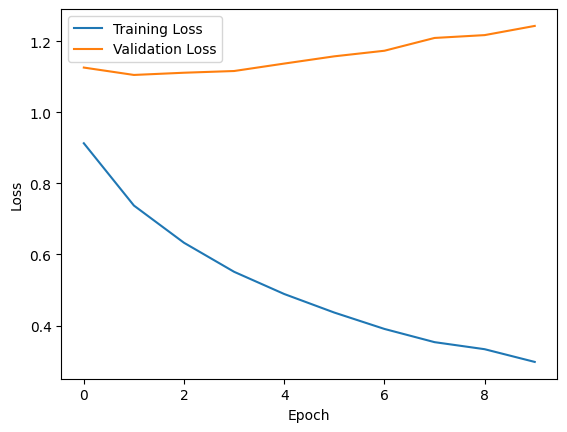

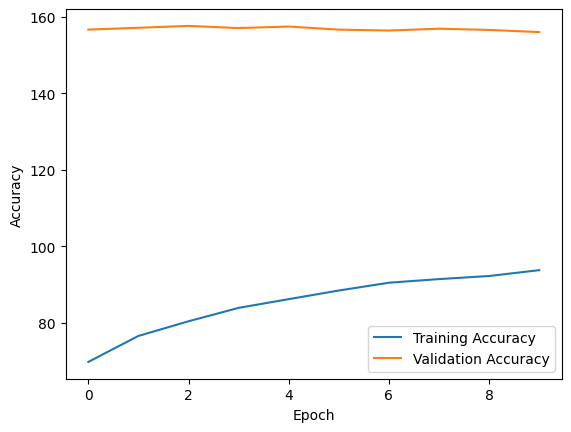

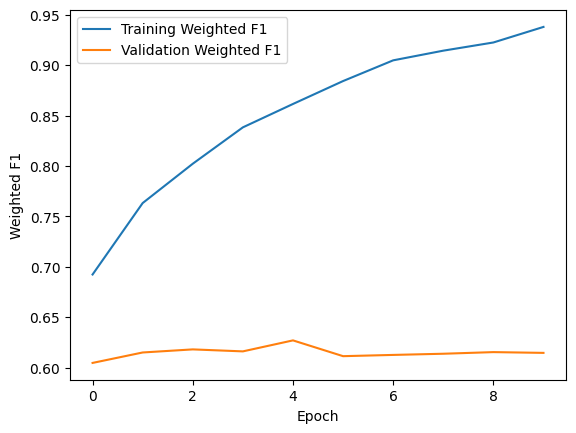

In [94]:
plot_loss(train_losses, test_losses)
plot_metrics(train_accuracies, test_accuracies, 'Accuracy')
plot_metrics(train_f1s, test_f1s, 'Weighted F1')

##### Простая аугментация изображений

Применим для тренировочной выборки простую аугментацию изображений

In [83]:
transform = v2.Compose([ 
    v2.Resize((224, 224)),
    v2.RandomVerticalFlip(p=.5),
    v2.RandomVerticalFlip(p=.5),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [84]:
trainset = GenresDataset(indices=x_train, 
                         classes=y_train,
                         root_dir=PATH,
                         transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                      shuffle=True, num_workers=4)

validset = GenresDataset(indices=x_valid, 
                         classes=y_valid,
                         root_dir=PATH,
                         transform=transform_base)
validloader = torch.utils.data.DataLoader(validset, batch_size=128,
                                          shuffle=True, num_workers=4)

Зафиксируем условия эксперимента

In [86]:
experimet_description = {
    'trainloader': trainloader, 
    'validloader': validloader,
    'descrition': 'Полная классификация. 100% данных. Простая аугментация',
    'criterion': 'nn.CrossEntropyLoss()',
    'optimizer': 'optim.Adam(model.parameters(), lr=0.005)',
    'model': "torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')",
    'model.fc': 'nn.Linear(num_features, num_classes)',
    'transform': transform,
}
dirname = create_dir(experimet_description, type='nn')

Сформируем модель

In [87]:
model = torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, num_classes)
for param in model.parameters():
    param.requires_grad = False
for param in model.fc.parameters():
    param.requires_grad = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.005)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


In [88]:
%%time

num_epochs = 200
model, \
train_losses, train_accuracies, train_f1s, \
test_losses, test_accuracies, test_f1s = train_epochs(
    model, 
    trainloader, 
    validloader, 
    criterion, 
    optimizer, 
    device,
    num_epochs,
    early_stopping_patience=5,
    path=dirname
)

The path is /kaggle/working/nn/05_02_24_03_20_15/
Epoch 1/200


100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


Train Loss: 1.5028 - Train Accuracy: 49.17% - Train F1: 0.4736
Valid Loss: 1.1820 - Valid Accuracy: 60.32% - Valid F1: 0.5899

Epoch 2/200


100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


Train Loss: 1.0364 - Train Accuracy: 64.64% - Train F1: 0.6406
Valid Loss: 1.1080 - Valid Accuracy: 61.69% - Valid F1: 0.6077

Epoch 3/200


100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


Train Loss: 0.8942 - Train Accuracy: 70.43% - Train F1: 0.7003
Valid Loss: 1.1036 - Valid Accuracy: 61.61% - Valid F1: 0.6090

Epoch 4/200


100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


Train Loss: 0.8057 - Train Accuracy: 73.42% - Train F1: 0.7313
Valid Loss: 1.1054 - Valid Accuracy: 61.94% - Valid F1: 0.6150

Epoch 5/200


100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


Train Loss: 0.7258 - Train Accuracy: 76.22% - Train F1: 0.7604
Valid Loss: 1.1328 - Valid Accuracy: 61.05% - Valid F1: 0.6020

Epoch 6/200


100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


Train Loss: 0.6696 - Train Accuracy: 78.66% - Train F1: 0.7856
Valid Loss: 1.1146 - Valid Accuracy: 62.18% - Valid F1: 0.6140

Epoch 7/200


100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


Train Loss: 0.6208 - Train Accuracy: 80.56% - Train F1: 0.8041
Valid Loss: 1.1330 - Valid Accuracy: 61.85% - Valid F1: 0.6120

Epoch 8/200


100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


Train Loss: 0.5864 - Train Accuracy: 81.20% - Train F1: 0.8106
Valid Loss: 1.1433 - Valid Accuracy: 62.34% - Valid F1: 0.6214

Epoch 9/200


100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


Train Loss: 0.5544 - Train Accuracy: 83.08% - Train F1: 0.8302
Valid Loss: 1.1643 - Valid Accuracy: 63.63% - Valid F1: 0.6292

Epoch 10/200


100%|██████████| 10/10 [00:05<00:00,  1.90it/s]


Train Loss: 0.5239 - Train Accuracy: 83.66% - Train F1: 0.8358
Valid Loss: 1.1645 - Valid Accuracy: 63.47% - Valid F1: 0.6319

Epoch 11/200


100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


Train Loss: 0.4921 - Train Accuracy: 85.62% - Train F1: 0.8555
Valid Loss: 1.1794 - Valid Accuracy: 62.90% - Valid F1: 0.6252

Epoch 12/200


100%|██████████| 10/10 [00:05<00:00,  1.95it/s]


Train Loss: 0.4734 - Train Accuracy: 85.90% - Train F1: 0.8584
Valid Loss: 1.2198 - Valid Accuracy: 62.18% - Valid F1: 0.6192

Epoch 13/200


100%|██████████| 10/10 [00:05<00:00,  1.75it/s]


Train Loss: 0.4593 - Train Accuracy: 86.20% - Train F1: 0.8617
Valid Loss: 1.2170 - Valid Accuracy: 62.26% - Valid F1: 0.6191

Epoch 14/200


100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


Train Loss: 0.4263 - Train Accuracy: 87.74% - Train F1: 0.8771
Valid Loss: 1.2442 - Valid Accuracy: 62.10% - Valid F1: 0.6148

Epoch 15/200


100%|██████████| 10/10 [00:05<00:00,  1.93it/s]


Train Loss: 0.4207 - Train Accuracy: 87.66% - Train F1: 0.8760
Valid Loss: 1.2633 - Valid Accuracy: 61.29% - Valid F1: 0.6128

Early stopping triggered: no improvement in test F1 score for 5 epochs.
The best epoch is #10
The best model is saved
The best weighed F1 score equals 0.631895451100309
CPU times: user 2min 30s, sys: 22.3 s, total: 2min 52s
Wall time: 6min 6s


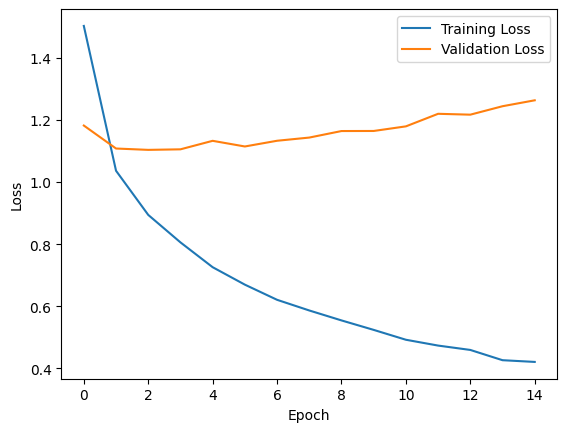

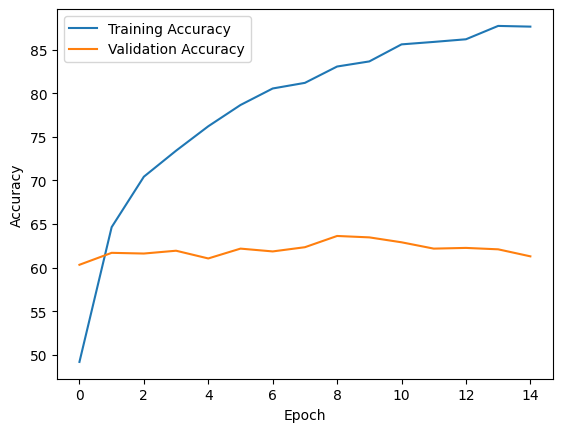

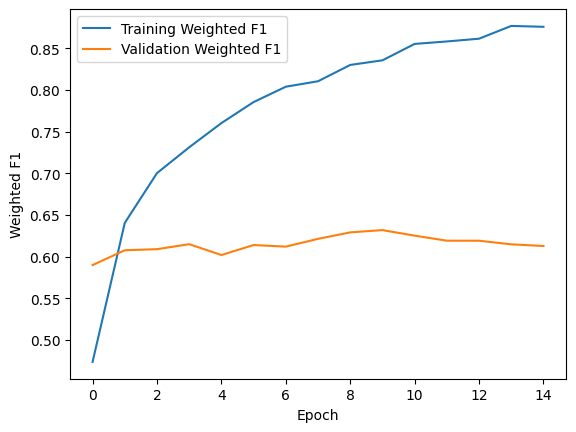

In [89]:
plot_loss(train_losses, test_losses)
plot_metrics(train_accuracies, test_accuracies, 'Accuracy')
plot_metrics(train_f1s, test_f1s, 'Weighted F1')

##### Случайная аугментация изображений

Применим для тренировочной выборки случайную автоаугментацию изображений

In [102]:
transform = v2.Compose([ 
    v2.Resize((224, 224)),
    v2.AutoAugment(v2.AutoAugmentPolicy.IMAGENET),
    v2.RandAugment(),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [103]:
trainset = GenresDataset(indices=x_train, 
                         classes=y_train,
                         root_dir=PATH,
                         transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                      shuffle=True, num_workers=4)

validset = GenresDataset(indices=x_valid, 
                         classes=y_valid,
                         root_dir=PATH,
                         transform=transform_base)
validloader = torch.utils.data.DataLoader(validset, batch_size=128,
                                          shuffle=True, num_workers=4)

Зафиксируем условия эксперимента

In [104]:
experimet_description = {
    'trainloader': trainloader, 
    'validloader': validloader,
    'descrition': 'Полная классификация. 100% данных. Случайная автоаугментация изображений',
    'criterion': 'nn.CrossEntropyLoss()',
    'optimizer': 'optim.Adam(model.parameters(), lr=0.005)',
    'model': "torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')",
    'model.fc': 'nn.Linear(num_features, num_classes)',
    'transform': transform,
}
dirname = create_dir(content, type='nn')

Сформируем модель

In [105]:
model = torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, num_classes)
for param in model.parameters():
    param.requires_grad = False
for param in model.fc.parameters():
    param.requires_grad = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.005)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


In [106]:
%%time

num_epochs = 200
model, \
train_losses, train_accuracies, train_f1s, \
test_losses, test_accuracies, test_f1s = train_epochs(
    model, 
    trainloader, 
    validloader, 
    criterion, 
    optimizer, 
    device,
    num_epochs,
    early_stopping_patience=5,
    path=dirname
)

The path is /kaggle/working/nn/04_30_24_23_18_03/
Epoch 1/200


100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


Train Loss: 1.6266 - Train Accuracy: 44.27% - Train F1: 0.4164
Valid Loss: 1.2315 - Valid Accuracy: 58.39% - Valid F1: 0.5747

Epoch 2/200


100%|██████████| 10/10 [00:04<00:00,  2.01it/s]


Train Loss: 1.2661 - Train Accuracy: 56.78% - Train F1: 0.5583
Valid Loss: 1.1568 - Valid Accuracy: 59.92% - Valid F1: 0.5882

Epoch 3/200


100%|██████████| 10/10 [00:04<00:00,  2.01it/s]


Train Loss: 1.1605 - Train Accuracy: 59.84% - Train F1: 0.5908
Valid Loss: 1.1337 - Valid Accuracy: 59.35% - Valid F1: 0.5889

Epoch 4/200


100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


Train Loss: 1.0801 - Train Accuracy: 63.55% - Train F1: 0.6287
Valid Loss: 1.1247 - Valid Accuracy: 61.05% - Valid F1: 0.6091

Epoch 5/200


100%|██████████| 10/10 [00:05<00:00,  1.98it/s]


Train Loss: 1.0413 - Train Accuracy: 64.28% - Train F1: 0.6375
Valid Loss: 1.1111 - Valid Accuracy: 61.29% - Valid F1: 0.6050

Epoch 6/200


100%|██████████| 10/10 [00:04<00:00,  2.08it/s]


Train Loss: 1.0144 - Train Accuracy: 65.77% - Train F1: 0.6547
Valid Loss: 1.1026 - Valid Accuracy: 62.34% - Valid F1: 0.6208

Epoch 7/200


100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


Train Loss: 0.9964 - Train Accuracy: 65.27% - Train F1: 0.6487
Valid Loss: 1.1188 - Valid Accuracy: 60.65% - Valid F1: 0.5976

Epoch 8/200


100%|██████████| 10/10 [00:04<00:00,  2.01it/s]


Train Loss: 0.9681 - Train Accuracy: 66.48% - Train F1: 0.6618
Valid Loss: 1.1222 - Valid Accuracy: 61.21% - Valid F1: 0.6044

Epoch 9/200


100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


Train Loss: 0.9502 - Train Accuracy: 67.06% - Train F1: 0.6675
Valid Loss: 1.1122 - Valid Accuracy: 62.10% - Valid F1: 0.6192

Epoch 10/200


100%|██████████| 10/10 [00:05<00:00,  1.98it/s]


Train Loss: 0.9435 - Train Accuracy: 67.47% - Train F1: 0.6716
Valid Loss: 1.1375 - Valid Accuracy: 61.77% - Valid F1: 0.6130

Epoch 11/200


100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


Train Loss: 0.9057 - Train Accuracy: 68.96% - Train F1: 0.6867
Valid Loss: 1.1410 - Valid Accuracy: 61.29% - Valid F1: 0.6077

Early stopping triggered: no improvement in test F1 score for 5 epochs.
The best epoch is #6
The best model is saved
The best weighed F1 score equals 0.6208499732573396
CPU times: user 1min 49s, sys: 16.2 s, total: 2min 5s
Wall time: 4min 56s


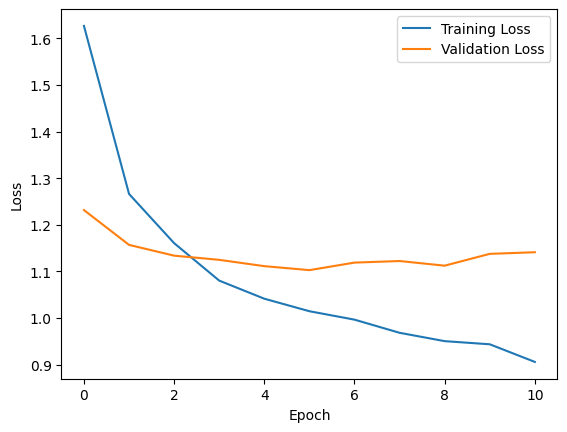

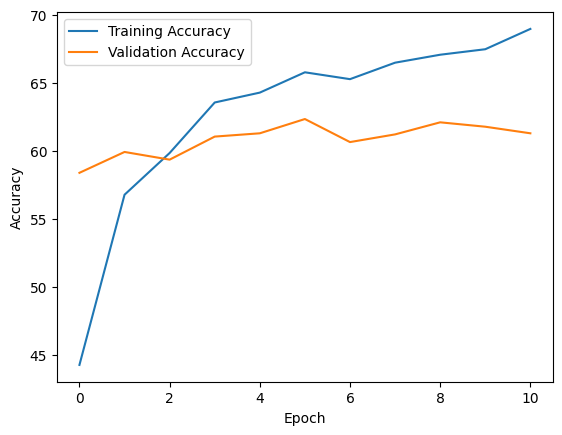

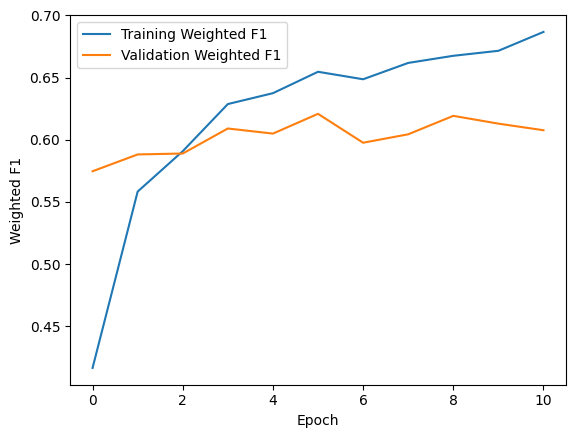

In [107]:
plot_loss(train_losses, test_losses)
plot_metrics(train_accuracies, test_accuracies, 'Accuracy')
plot_metrics(train_f1s, test_f1s, 'Weighted F1')

##### Создание кастомной аугментации

Применим для тренировочной выборки дополнительно кастомную аугментацию (GridMask)

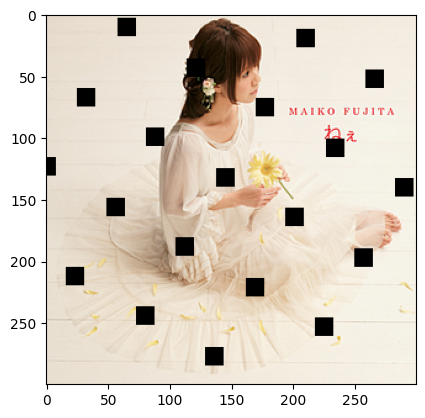

In [108]:
from PIL import Image, ImageDraw
import numpy as np
import math

def add_grid(image: Image.Image, 
             grid_size: int = 20, 
             color: Tuple[int, int, int] = (0, 0, 0), 
             distance: int = 50, 
             square_size: int = 15, 
             rotation_angle: int = 30) -> Image.Image:
    """
    Добавляет сетку квадратов на изображение.

    Parameters
    ----------
    image : Image.Image
        Изображение, на которое добавляется сетка.
    grid_size : int, optional
        Размер сетки (расстояние между квадратами), по умолчанию 20.
    color : Tuple[int, int, int], optional
        Цвет квадратов в формате RGB, по умолчанию (0, 0, 0) (черный).
    distance : int, optional
        Расстояние между квадратами в сетке, по умолчанию 50.
    square_size : int, optional
        Размер квадратов в сетке, по умолчанию 15.
    rotation_angle : int, optional
        Угол поворота квадратов в сетке (в градусах), по умолчанию 30.

    Returns
    -------
    Image.Image
        Изображение с добавленной сеткой квадратов.
    """
    # Конвертировать изображение в режим RGB (если оно не в этом режиме)
    if image.mode != 'RGB':
        image = image.convert('RGB')

    # Создать объект ImageDraw
    draw = ImageDraw.Draw(image)

    # Получить размеры изображения
    width, height = image.size

    # Повернуть угол в радианы
    angle_rad = math.radians(rotation_angle)
    cos_angle = math.cos(angle_rad)
    sin_angle = math.sin(angle_rad)

    # Нарисовать сетку квадратов
    for x in range(0, width - square_size, distance + square_size):
        for y in range(0, height - square_size, distance + square_size):
            # Определить координаты центра квадрата
            center_x = x + square_size // 2
            center_y = y + square_size // 2

            # Повернуть координаты центра квадрата
            rotated_center_x = int(
                (center_x - width / 2) * cos_angle 
                - (center_y - height / 2) * sin_angle 
                + width / 2
            )
            rotated_center_y = int(
                (center_x - width / 2) * sin_angle 
                + (center_y - height / 2) * cos_angle 
                + height / 2
            )

            # Определить координаты углов квадрата
            top_left = (
                rotated_center_x - square_size // 2, 
                rotated_center_y - square_size // 2
            )
            bottom_right = (
                rotated_center_x + square_size // 2, 
                rotated_center_y + square_size // 2
            )

            # Нарисовать прямоугольник
            draw.rectangle([top_left, bottom_right], fill=color)

    return image

image_path = "anime/0eeeb381-2218-44f6-92ae-06b72874b6ff.png"
image = Image.open(PATH + image_path)

grid_image = add_grid(image, grid_size=50, color=(0, 0, 0), rotation_angle=30)

plt.imshow(grid_image)
plt.show()

In [109]:
import numpy as np
import torch
import torch.nn.functional as F
import torchvision.transforms.functional as TF

import numpy as np
from PIL import Image
from typing import Union

class GridMask:
    """
    Реализует трансформацию сетки квадратов на изображении.

    Parameters
    ----------
    p : float, optional
        Вероятность применения трансформации, по умолчанию 0.5.
    num_grid : tuple, optional
        Количество квадратов в сетке, по умолчанию (3, 6).
    rotate : int, optional
        Угол поворота квадратов в сетке (в градусах), по умолчанию 15.
    ratio : float, optional
        Соотношение размера квадратов к размеру изображения, по умолчанию 0.5.
    """
    def __init__(self, p: float = 0.5, 
                       num_grid: tuple = (3, 6), 
                       rotate: int = 15, 
                       ratio: float = 0.5) -> None:
        self.p = p
        self.num_grid = num_grid
        self.rotate = rotate
        self.ratio = ratio

    def __call__(
        self, 
        img: Union[Image.Image, np.ndarray]
    ) -> Union[Image.Image, np.ndarray]:
        """
        Применяет трансформацию сетки квадратов к изображению.

        Parameters
        ----------
        img : Union[Image.Image, np.ndarray]
            Изображение для применения трансформации.

        Returns
        -------
        Union[Image.Image, np.ndarray]
            Изображение с примененной трансформацией.
        """
        if np.random.rand() > self.p:
            return img

        img = add_grid(img, grid_size=20, color=(0, 0, 0))
        return img

In [110]:
transform = v2.Compose([ 
    v2.Resize((224, 224)),
    v2.AutoAugment(v2.AutoAugmentPolicy.IMAGENET),
    v2.RandAugment(),
    GridMask(p=0.5),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [111]:
trainset = GenresDataset(indices=x_train, 
                         classes=y_train,
                         root_dir=PATH,
                         transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                      shuffle=True, num_workers=4)

validset = GenresDataset(indices=x_valid, 
                         classes=y_valid,
                         root_dir=PATH,
                         transform=transform_base)
validloader = torch.utils.data.DataLoader(validset, batch_size=128,
                                          shuffle=True, num_workers=4)

Зафиксируем условия эксперимента

In [113]:
experimet_description = {
    'trainloader': trainloader, 
    'validloader': validloader,
    'descrition': 'Полная классификация. 100% данных. Случайная автоаугментация и GridMask изображений',
    'criterion': 'nn.CrossEntropyLoss()',
    'optimizer': 'optim.Adam(model.parameters(), lr=0.005)',
    'model': "torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')",
    'model.fc': 'nn.Linear(num_features, num_classes)',
    'transform': transform,
}
dirname = create_dir(content, type='nn')

Сформируем модель

In [114]:
model = torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, num_classes)
for param in model.parameters():
    param.requires_grad = False
for param in model.fc.parameters():
    param.requires_grad = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.005)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


In [115]:
%%time

num_epochs = 200
model, \
train_losses, train_accuracies, train_f1s, \
test_losses, test_accuracies, test_f1s = train_epochs(
    model, 
    trainloader, 
    validloader, 
    criterion, 
    optimizer, 
    device,
    num_epochs,
    early_stopping_patience=5,
    path=dirname
)

The path is /kaggle/working/nn/04_30_24_23_24_20/
Epoch 1/200


100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


Train Loss: 1.6187 - Train Accuracy: 44.15% - Train F1: 0.4229
Valid Loss: 1.2821 - Valid Accuracy: 55.81% - Valid F1: 0.5347

Epoch 2/200


100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


Train Loss: 1.2928 - Train Accuracy: 55.95% - Train F1: 0.5504
Valid Loss: 1.2014 - Valid Accuracy: 58.79% - Valid F1: 0.5791

Epoch 3/200


100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


Train Loss: 1.1990 - Train Accuracy: 58.98% - Train F1: 0.5810
Valid Loss: 1.1612 - Valid Accuracy: 59.19% - Valid F1: 0.5862

Epoch 4/200


100%|██████████| 10/10 [00:04<00:00,  2.03it/s]


Train Loss: 1.1284 - Train Accuracy: 60.95% - Train F1: 0.6047
Valid Loss: 1.1362 - Valid Accuracy: 61.05% - Valid F1: 0.6024

Epoch 5/200


100%|██████████| 10/10 [00:05<00:00,  1.96it/s]


Train Loss: 1.0779 - Train Accuracy: 63.07% - Train F1: 0.6261
Valid Loss: 1.1135 - Valid Accuracy: 61.37% - Valid F1: 0.6060

Epoch 6/200


100%|██████████| 10/10 [00:04<00:00,  2.02it/s]


Train Loss: 1.0581 - Train Accuracy: 63.03% - Train F1: 0.6249
Valid Loss: 1.1452 - Valid Accuracy: 60.24% - Valid F1: 0.6009

Epoch 7/200


100%|██████████| 10/10 [00:04<00:00,  2.04it/s]


Train Loss: 1.0433 - Train Accuracy: 63.41% - Train F1: 0.6301
Valid Loss: 1.1040 - Valid Accuracy: 62.34% - Valid F1: 0.6140

Epoch 8/200


100%|██████████| 10/10 [00:05<00:00,  1.98it/s]


Train Loss: 1.0147 - Train Accuracy: 65.23% - Train F1: 0.6484
Valid Loss: 1.1320 - Valid Accuracy: 61.45% - Valid F1: 0.6100

Epoch 9/200


100%|██████████| 10/10 [00:05<00:00,  1.91it/s]


Train Loss: 0.9941 - Train Accuracy: 65.73% - Train F1: 0.6531
Valid Loss: 1.1211 - Valid Accuracy: 62.26% - Valid F1: 0.6160

Epoch 10/200


100%|██████████| 10/10 [00:05<00:00,  1.95it/s]


Train Loss: 0.9836 - Train Accuracy: 66.74% - Train F1: 0.6636
Valid Loss: 1.1473 - Valid Accuracy: 60.40% - Valid F1: 0.6004

Epoch 11/200


100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


Train Loss: 0.9684 - Train Accuracy: 66.92% - Train F1: 0.6660
Valid Loss: 1.1316 - Valid Accuracy: 61.21% - Valid F1: 0.6094

Epoch 12/200


100%|██████████| 10/10 [00:05<00:00,  1.95it/s]


Train Loss: 0.9530 - Train Accuracy: 66.92% - Train F1: 0.6660
Valid Loss: 1.1375 - Valid Accuracy: 62.74% - Valid F1: 0.6206

Epoch 13/200


100%|██████████| 10/10 [00:04<00:00,  2.02it/s]


Train Loss: 0.9326 - Train Accuracy: 68.46% - Train F1: 0.6818
Valid Loss: 1.1129 - Valid Accuracy: 62.10% - Valid F1: 0.6213

Epoch 14/200


100%|██████████| 10/10 [00:04<00:00,  2.02it/s]


Train Loss: 0.9565 - Train Accuracy: 66.90% - Train F1: 0.6664
Valid Loss: 1.1318 - Valid Accuracy: 61.77% - Valid F1: 0.6127

Epoch 15/200


100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


Train Loss: 0.9125 - Train Accuracy: 68.43% - Train F1: 0.6816
Valid Loss: 1.1276 - Valid Accuracy: 62.50% - Valid F1: 0.6171

Epoch 16/200


100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


Train Loss: 0.9237 - Train Accuracy: 69.16% - Train F1: 0.6882
Valid Loss: 1.1490 - Valid Accuracy: 61.13% - Valid F1: 0.6076

Epoch 17/200


100%|██████████| 10/10 [00:04<00:00,  2.02it/s]


Train Loss: 0.8971 - Train Accuracy: 68.74% - Train F1: 0.6844
Valid Loss: 1.1524 - Valid Accuracy: 62.02% - Valid F1: 0.6198

Epoch 18/200


100%|██████████| 10/10 [00:04<00:00,  2.00it/s]


Train Loss: 0.8956 - Train Accuracy: 69.08% - Train F1: 0.6891
Valid Loss: 1.1678 - Valid Accuracy: 60.89% - Valid F1: 0.6031

Early stopping triggered: no improvement in test F1 score for 5 epochs.
The best epoch is #13
The best model is saved
The best weighed F1 score equals 0.6213422484602859
CPU times: user 2min 58s, sys: 26.1 s, total: 3min 25s
Wall time: 8min 5s


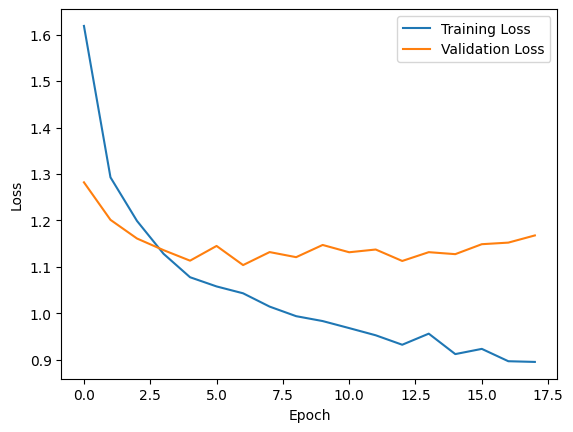

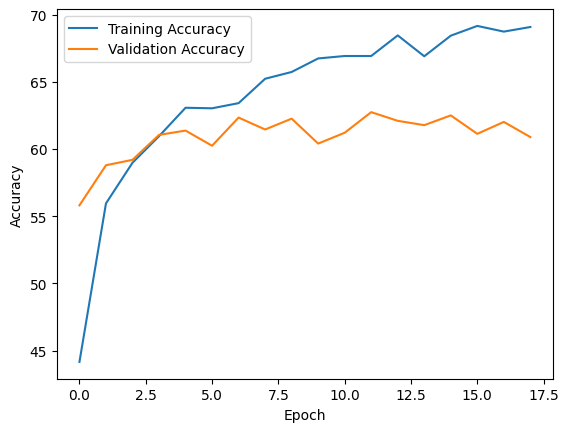

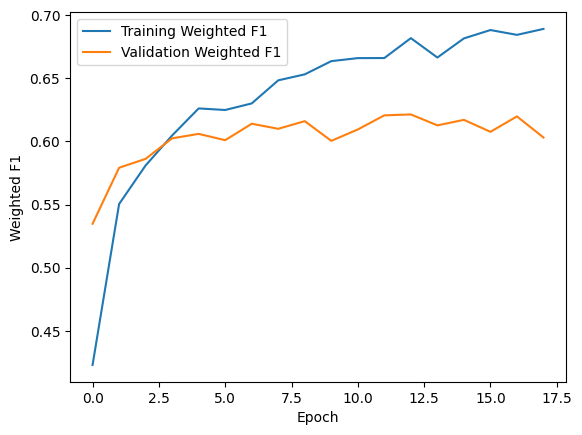

In [116]:
plot_loss(train_losses, test_losses)
plot_metrics(train_accuracies, test_accuracies, 'Accuracy')
plot_metrics(train_f1s, test_f1s, 'Weighted F1')

##### Устранение дисбаланса классов

Реализуем устранение дисбаланса путем взвешивания классов

In [117]:
transform = v2.Compose([ 
    v2.Resize((224, 224)),
    v2.AutoAugment(v2.AutoAugmentPolicy.IMAGENET),
    v2.RandAugment(),
    GridMask(p=0.5),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [118]:
counts = check_counts(x_train, y_train, idx_to_class)
counts

{'classical': 608,
 'country': 948,
 'anime': 756,
 'disco': 297,
 'edm': 449,
 'jazz': 523,
 'reggae': 369,
 'black metal': 286,
 'pop': 504,
 'rap': 208}

In [119]:
weights = []
maxima = max(counts.values())
for _, name in idx_to_class.items():
    weights.append(maxima/counts[name])
weights

[1.253968253968254,
 3.3146853146853146,
 1.5592105263157894,
 1.0,
 3.191919191919192,
 2.111358574610245,
 1.812619502868069,
 1.880952380952381,
 4.5576923076923075,
 2.569105691056911]

In [120]:
# Определим веса классов в тензоре
tensor_weights = torch.tensor(weights, dtype=torch.float32)
tensor_weights = tensor_weights.to(device)

In [121]:
trainset = GenresDataset(indices=x_train, 
                         classes=y_train,
                         root_dir=PATH,
                         transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                      shuffle=True, num_workers=4)

validset = GenresDataset(indices=x_valid, 
                         classes=y_valid,
                         root_dir=PATH,
                         transform=transform_base)
validloader = torch.utils.data.DataLoader(validset, batch_size=128,
                                          shuffle=True, num_workers=4)

Зафиксируем условия эксперимента

In [122]:
experimet_description = {
    'trainloader': trainloader, 
    'validloader': validloader,
    'descrition': 'Полная классификация. 100% данных. Взешивание классов. Случайная автоаугментация и GridMask изображений',
    'criterion': 'nn.CrossEntropyLoss()',
    'optimizer': 'optim.Adam(model.parameters(), lr=0.005)',
    'model': "torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')",
    'model.fc': 'nn.Linear(num_features, num_classes)',
    'transform': transform,
}
dirname = create_dir(content, type='nn')

Сформируем модель

In [123]:
model = torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, num_classes)
for param in model.parameters():
    param.requires_grad = False
for param in model.fc.parameters():
    param.requires_grad = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = nn.CrossEntropyLoss(weight=tensor_weights)
optimizer = optim.Adam(model.parameters(), lr=0.005)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


In [124]:
%%time

num_epochs = 200
model, \
train_losses, train_accuracies, train_f1s, \
test_losses, test_accuracies, test_f1s = train_epochs(
    model, 
    trainloader, 
    validloader, 
    criterion, 
    optimizer, 
    device,
    num_epochs,
    early_stopping_patience=5,
    path=dirname
)

The path is /kaggle/working/nn/04_30_24_23_32_37/
Epoch 1/200


100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


Train Loss: 1.6769 - Train Accuracy: 42.19% - Train F1: 0.4258
Valid Loss: 1.2541 - Valid Accuracy: 57.58% - Valid F1: 0.5730

Epoch 2/200


100%|██████████| 10/10 [00:04<00:00,  2.07it/s]


Train Loss: 1.3231 - Train Accuracy: 54.56% - Train F1: 0.5469
Valid Loss: 1.1715 - Valid Accuracy: 56.94% - Valid F1: 0.5711

Epoch 3/200


100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


Train Loss: 1.2185 - Train Accuracy: 57.44% - Train F1: 0.5779
Valid Loss: 1.1425 - Valid Accuracy: 58.95% - Valid F1: 0.5944

Epoch 4/200


100%|██████████| 10/10 [00:05<00:00,  1.94it/s]


Train Loss: 1.1489 - Train Accuracy: 58.63% - Train F1: 0.5877
Valid Loss: 1.1379 - Valid Accuracy: 57.58% - Valid F1: 0.5802

Epoch 5/200


100%|██████████| 10/10 [00:04<00:00,  2.00it/s]


Train Loss: 1.1207 - Train Accuracy: 59.70% - Train F1: 0.5988
Valid Loss: 1.1083 - Valid Accuracy: 60.56% - Valid F1: 0.6081

Epoch 6/200


100%|██████████| 10/10 [00:05<00:00,  1.98it/s]


Train Loss: 1.0620 - Train Accuracy: 62.08% - Train F1: 0.6225
Valid Loss: 1.1164 - Valid Accuracy: 61.53% - Valid F1: 0.6145

Epoch 7/200


100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


Train Loss: 1.0495 - Train Accuracy: 62.81% - Train F1: 0.6301
Valid Loss: 1.1322 - Valid Accuracy: 59.84% - Valid F1: 0.6000

Epoch 8/200


100%|██████████| 10/10 [00:04<00:00,  2.01it/s]


Train Loss: 1.0372 - Train Accuracy: 62.95% - Train F1: 0.6309
Valid Loss: 1.1312 - Valid Accuracy: 60.32% - Valid F1: 0.6092

Epoch 9/200


100%|██████████| 10/10 [00:04<00:00,  2.03it/s]


Train Loss: 1.0001 - Train Accuracy: 64.48% - Train F1: 0.6448
Valid Loss: 1.1417 - Valid Accuracy: 58.47% - Valid F1: 0.5895

Epoch 10/200


100%|██████████| 10/10 [00:05<00:00,  2.00it/s]


Train Loss: 0.9788 - Train Accuracy: 64.89% - Train F1: 0.6514
Valid Loss: 1.1510 - Valid Accuracy: 59.19% - Valid F1: 0.5941

Epoch 11/200


100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


Train Loss: 0.9547 - Train Accuracy: 65.51% - Train F1: 0.6564
Valid Loss: 1.1731 - Valid Accuracy: 58.95% - Valid F1: 0.5926

Early stopping triggered: no improvement in test F1 score for 5 epochs.
The best epoch is #6
The best model is saved
The best weighed F1 score equals 0.6145367070175336
CPU times: user 1min 49s, sys: 16.1 s, total: 2min 5s
Wall time: 4min 59s


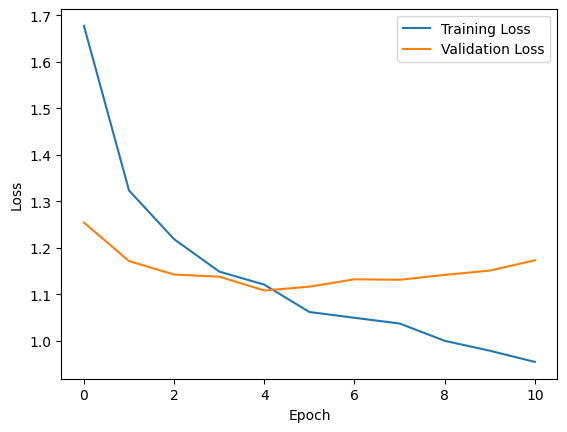

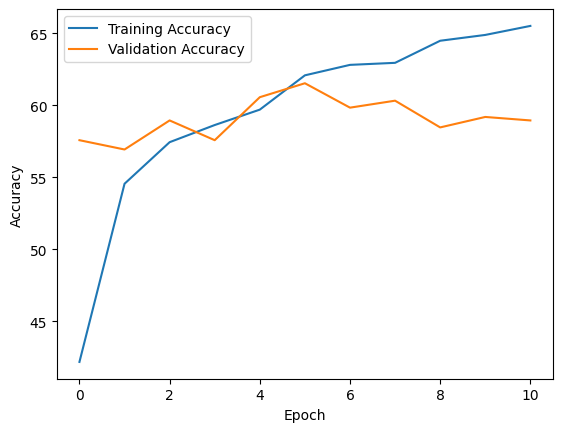

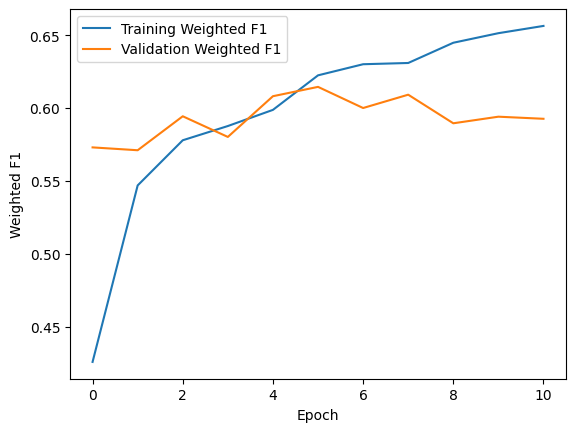

In [125]:
plot_loss(train_losses, test_losses)
plot_metrics(train_accuracies, test_accuracies, 'Accuracy')
plot_metrics(train_f1s, test_f1s, 'Weighted F1')

Реализуем устранение дисбаланса путем дополнения батчек (оверсемплинг) средствами PyTorch

In [126]:
transform = v2.Compose([ 
    v2.Resize((224, 224)),
    v2.AutoAugment(v2.AutoAugmentPolicy.IMAGENET),
    v2.RandAugment(),
    GridMask(p=0.5),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [127]:
trainset = GenresDataset(indices=x_train, 
                         classes=y_train,
                         root_dir=PATH,
                         transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                      shuffle=True, num_workers=4)

validset = GenresDataset(indices=x_valid, 
                         classes=y_valid,
                         root_dir=PATH,
                         transform=transform_base)
validloader = torch.utils.data.DataLoader(validset, batch_size=128,
                                          shuffle=True, num_workers=4)

In [129]:
# Here we have an imbalanced dataset
for batch_idx, (data, target) in enumerate(trainloader):
    print('Batch {}, classes {}, count {}'.format(
        batch_idx, *np.unique(target.numpy(), return_counts=True)))
    # Your model will most likely perform bad, and will overfit on the 
    # majority classes

Batch 0, classes [0 1 2 3 4 5 6 7 8 9], count [20  4 19 26  6  6 13 12  2 20]
Batch 1, classes [0 1 2 3 4 5 6 7 8 9], count [19  7 21 24  5 10 14 13  6  9]
Batch 2, classes [0 1 2 3 4 5 6 7 8 9], count [10  3 21 34 10 10  7 19  6  8]
Batch 3, classes [0 1 2 3 4 5 6 7 8 9], count [29  5 11 20  8 16 11 17  2  9]
Batch 4, classes [0 1 2 3 4 5 6 7 8 9], count [17 13 12 20  4  8 17 22  8  7]
Batch 5, classes [0 1 2 3 4 5 6 7 8 9], count [22  7 13 20 13 13 13 15  2 10]
Batch 6, classes [0 1 2 3 4 5 6 7 8 9], count [12 12 19 22  9 13 16 11  5  9]
Batch 7, classes [0 1 2 3 4 5 6 7 8 9], count [23  6 11 21 14  9 14 15  2 13]
Batch 8, classes [0 1 2 3 4 5 6 7 8 9], count [18 14 11 23  6  8 23 11  5  9]
Batch 9, classes [0 1 2 3 4 5 6 7 8 9], count [28  7 13 31  1 11 15  9  5  8]
Batch 10, classes [0 1 2 3 4 5 6 7 8 9], count [20  3 13 24 13 10 16 14  6  9]
Batch 11, classes [0 1 2 3 4 5 6 7 8 9], count [24  7 20 20 12  6 14 13  5  7]
Batch 12, classes [0 1 2 3 4 5 6 7 8 9], count [20  6 19 24  6

In [130]:
# Oversample the minority classes
targets = y_train
class_count = np.unique(targets, return_counts=True)[1]
print(class_count)

[757 287 609 949 298 450 524 505 209 370]


In [131]:
weight = 1. / class_count
samples_weight = weight[targets.astype('int')]
samples_weight = torch.from_numpy(samples_weight)
sampler = WeightedRandomSampler(samples_weight, len(samples_weight))

In [132]:
weighted_trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                                   shuffle=False, num_workers=4, 
                                                   sampler=sampler)

In [133]:
# Here we have a balanced dataset due to oversampling
for batch_idx, (data, target) in enumerate(weighted_trainloader):
    print('Batch {}, classes {}, count {}'.format(
        batch_idx, *np.unique(target.numpy(), return_counts=True)))
    # Your model will propably perform better here

Batch 0, classes [0 1 2 3 4 5 6 7 8 9], count [13 12 12 15 10 13 11 15 14 13]
Batch 1, classes [0 1 2 3 4 5 6 7 8 9], count [18 16  9 14 12 12 14 11 11 11]
Batch 2, classes [0 1 2 3 4 5 6 7 8 9], count [16 13 15 16 12  8 12 13 15  8]
Batch 3, classes [0 1 2 3 4 5 6 7 8 9], count [11  6  8 11 22 14 16  6 16 18]
Batch 4, classes [0 1 2 3 4 5 6 7 8 9], count [10  9 12 11 16 17 14 12 12 15]
Batch 5, classes [0 1 2 3 4 5 6 7 8 9], count [13 10 10  8 10 13 18 15  9 22]
Batch 6, classes [0 1 2 3 4 5 6 7 8 9], count [11 13 18 12 13 11 13 18  9 10]
Batch 7, classes [0 1 2 3 4 5 6 7 8 9], count [16 15 12 16 12 10 11 11 12 13]
Batch 8, classes [0 1 2 3 4 5 6 7 8 9], count [15 17 12 12  8 15 13  9 12 15]
Batch 9, classes [0 1 2 3 4 5 6 7 8 9], count [ 5 19 17  9 12 16 13  9 18 10]
Batch 10, classes [0 1 2 3 4 5 6 7 8 9], count [ 7 14 13 22 13 12 13  8 17  9]
Batch 11, classes [0 1 2 3 4 5 6 7 8 9], count [14 11  8 10 10  9  9 19 15 23]
Batch 12, classes [0 1 2 3 4 5 6 7 8 9], count [13 17 17 16 10

Зафиксируем условия эксперимента

In [134]:
experimet_description = {
    'trainloader': trainloader, 
    'validloader': validloader,
    'descrition': 'Полная классификация. 100% данных. Оверсемплинг PyTorch. Случайная автоаугментация и GridMask изображений',
    'criterion': 'nn.CrossEntropyLoss()',
    'optimizer': 'optim.Adam(model.parameters(), lr=0.005)',
    'model': "torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')",
    'model.fc': 'nn.Linear(num_features, num_classes)',
    'transform': transform,
}
dirname = create_dir(experimet_description, type='nn')

Сформируем модель

In [135]:
model = torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, num_classes)
for param in model.parameters():
    param.requires_grad = False
for param in model.fc.parameters():
    param.requires_grad = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.005)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


In [136]:
%%time

num_epochs = 200
model, \
train_losses, train_accuracies, train_f1s, \
test_losses, test_accuracies, test_f1s = train_epochs(
    model, 
    weighted_trainloader, 
    validloader, 
    criterion, 
    optimizer, 
    device,
    num_epochs,
    early_stopping_patience=5,
    path=dirname
)

The path is /kaggle/working/nn/04_30_24_23_39_04/
Epoch 1/200


100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


Train Loss: 1.5947 - Train Accuracy: 45.93% - Train F1: 0.4528
Valid Loss: 1.3068 - Valid Accuracy: 55.81% - Valid F1: 0.5532

Epoch 2/200


100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


Train Loss: 1.2692 - Train Accuracy: 57.79% - Train F1: 0.5723
Valid Loss: 1.2228 - Valid Accuracy: 57.58% - Valid F1: 0.5745

Epoch 3/200


100%|██████████| 10/10 [00:04<00:00,  2.02it/s]


Train Loss: 1.1939 - Train Accuracy: 59.86% - Train F1: 0.5944
Valid Loss: 1.1784 - Valid Accuracy: 59.44% - Valid F1: 0.5837

Epoch 4/200


100%|██████████| 10/10 [00:05<00:00,  1.98it/s]


Train Loss: 1.1350 - Train Accuracy: 62.18% - Train F1: 0.6168
Valid Loss: 1.2000 - Valid Accuracy: 59.60% - Valid F1: 0.5935

Epoch 5/200


100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


Train Loss: 1.0919 - Train Accuracy: 62.73% - Train F1: 0.6241
Valid Loss: 1.1504 - Valid Accuracy: 60.97% - Valid F1: 0.6033

Epoch 6/200


100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


Train Loss: 1.0365 - Train Accuracy: 65.49% - Train F1: 0.6511
Valid Loss: 1.1602 - Valid Accuracy: 61.69% - Valid F1: 0.6150

Epoch 7/200


100%|██████████| 10/10 [00:04<00:00,  2.03it/s]


Train Loss: 1.0118 - Train Accuracy: 66.86% - Train F1: 0.6659
Valid Loss: 1.1529 - Valid Accuracy: 60.89% - Valid F1: 0.6076

Epoch 8/200


100%|██████████| 10/10 [00:05<00:00,  1.86it/s]


Train Loss: 1.0042 - Train Accuracy: 66.90% - Train F1: 0.6654
Valid Loss: 1.1678 - Valid Accuracy: 60.40% - Valid F1: 0.6047

Epoch 9/200


100%|██████████| 10/10 [00:04<00:00,  2.01it/s]


Train Loss: 0.9800 - Train Accuracy: 67.65% - Train F1: 0.6739
Valid Loss: 1.1697 - Valid Accuracy: 60.40% - Valid F1: 0.5999

Epoch 10/200


100%|██████████| 10/10 [00:04<00:00,  2.01it/s]


Train Loss: 0.9226 - Train Accuracy: 69.34% - Train F1: 0.6908
Valid Loss: 1.1517 - Valid Accuracy: 59.92% - Valid F1: 0.6023

Epoch 11/200


100%|██████████| 10/10 [00:04<00:00,  2.02it/s]


Train Loss: 0.9321 - Train Accuracy: 68.46% - Train F1: 0.6820
Valid Loss: 1.1417 - Valid Accuracy: 61.29% - Valid F1: 0.6130

Early stopping triggered: no improvement in test F1 score for 5 epochs.
The best epoch is #6
The best model is saved
The best weighed F1 score equals 0.6149902482552205
CPU times: user 1min 49s, sys: 15.6 s, total: 2min 5s
Wall time: 4min 53s


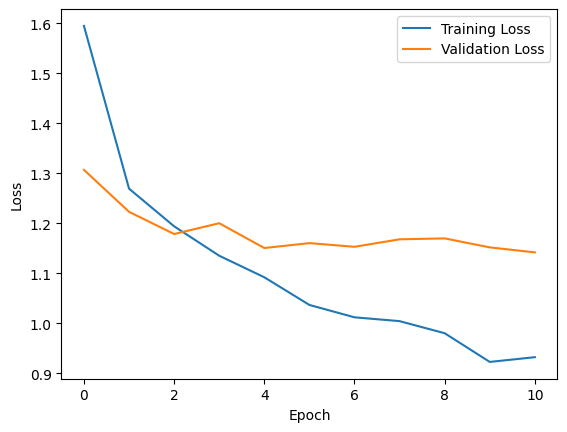

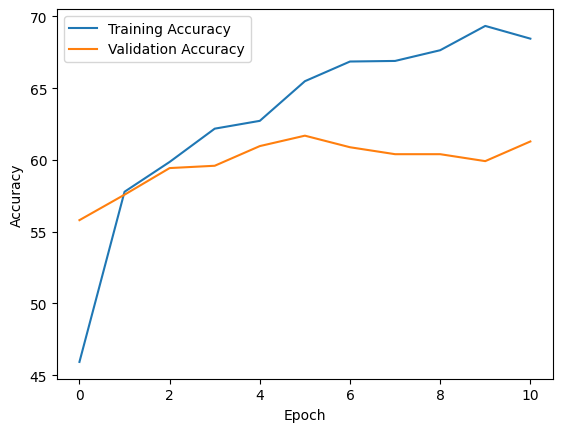

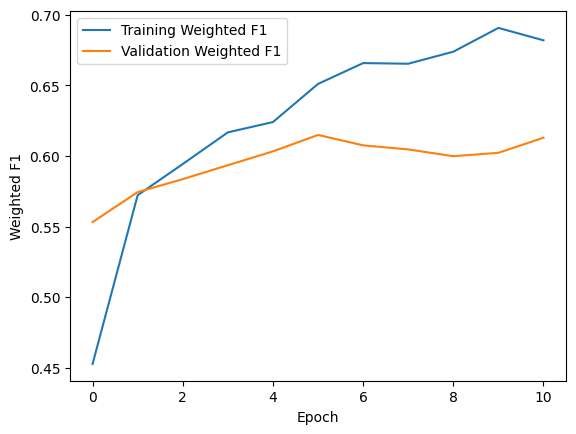

In [137]:
plot_loss(train_losses, test_losses)
plot_metrics(train_accuracies, test_accuracies, 'Accuracy')
plot_metrics(train_f1s, test_f1s, 'Weighted F1')

Реализуем устранение дисбаланса путем прямого оверсемплинга

In [138]:
transform = v2.Compose([ 
    v2.Resize((224, 224)),
    v2.AutoAugment(v2.AutoAugmentPolicy.IMAGENET),
    v2.RandAugment(),
    GridMask(p=0.5),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [139]:
def oversampling_data(data, rate):
    maxima = 0
    new_data = copy.deepcopy(data)
    for item in new_data.values():
        if len(item) > maxima:
            maxima = len(item)
    for k, v in new_data.items():
        random.seed(1206)
        values = random.choices(new_data[k], k=maxima-len(v))
        new_data[k] += values
        new_data[k] += new_data[k]*rate
    return new_data

In [140]:
def under_reconfig_data(data):
    new_data = []
    for k,v in data.items():
        for item in v:
            new_data.append(f"{k}/{item}")
    return new_data

In [141]:
def get_labels(data, idx_to_class):
    labels = []
    class_to_idx = {value: key for key, value in idx_to_class.items()}
    for item in data:
        classname = item.split('/')[0]
        labels.append(class_to_idx[classname])
    return labels

In [142]:
def get_oversampled_data(x, y, idx_to_class, rate):
    x_reconfig = reconfig_data(x)
    x_over = oversampling_data(x_reconfig, rate)
    x_over = under_reconfig_data(x_over)
    y_over = get_labels(x_over, idx_to_class)
    return x_over, y_over

In [143]:
x_over, y_over = get_oversampled_data(x_train, y_train, idx_to_class, 0)

In [144]:
check_counts(x_over, y_over, idx_to_class)

{'classical': 947,
 'country': 947,
 'anime': 947,
 'disco': 947,
 'edm': 947,
 'jazz': 947,
 'reggae': 947,
 'black metal': 947,
 'pop': 947,
 'rap': 947}

In [145]:
trainset = GenresDataset(indices=x_over, 
                         classes=y_over,
                         root_dir=PATH,
                         transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                      shuffle=True, num_workers=4)

validset = GenresDataset(indices=x_valid, 
                         classes=y_valid,
                         root_dir=PATH,
                         transform=transform_base)
validloader = torch.utils.data.DataLoader(validset, batch_size=128,
                                          shuffle=True, num_workers=4)

Зафиксируем условия эксперимента

In [146]:
experimet_description = {
    'trainloader': trainloader, 
    'validloader': validloader,
    'descrition': 'Полная классификация. 100% данных. Кастомный оверсемплинг (рейт 0). Случайная автоаугментация и GridMask изображений',
    'criterion': 'nn.CrossEntropyLoss()',
    'optimizer': 'optim.Adam(model.parameters(), lr=0.005)',
    'model': "torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')",
    'model.fc': 'nn.Linear(num_features, num_classes)',
    'transform': transform,
}
dirname = create_dir(experimet_description, type='nn')

Сформируем модель

In [147]:
model = torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, num_classes)
for param in model.parameters():
    param.requires_grad = False
for param in model.fc.parameters():
    param.requires_grad = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.005)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


In [148]:
%%time

num_epochs = 200
model, \
train_losses, train_accuracies, train_f1s, \
test_losses, test_accuracies, test_f1s = train_epochs(
    model, 
    trainloader, 
    validloader, 
    criterion, 
    optimizer, 
    device,
    num_epochs,
    early_stopping_patience=5,
    path=dirname
)

The path is /kaggle/working/nn/04_30_24_23_44_21/
Epoch 1/200


100%|██████████| 10/10 [00:04<00:00,  2.02it/s]


Train Loss: 1.4674 - Train Accuracy: 49.85% - Train F1: 0.4930
Valid Loss: 1.1960 - Valid Accuracy: 59.76% - Valid F1: 0.5819

Epoch 2/200


100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


Train Loss: 1.1721 - Train Accuracy: 60.63% - Train F1: 0.6017
Valid Loss: 1.1605 - Valid Accuracy: 60.32% - Valid F1: 0.6077

Epoch 3/200


100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


Train Loss: 1.0608 - Train Accuracy: 64.64% - Train F1: 0.6438
Valid Loss: 1.2119 - Valid Accuracy: 59.19% - Valid F1: 0.5852

Epoch 4/200


100%|██████████| 10/10 [00:05<00:00,  1.95it/s]


Train Loss: 1.0068 - Train Accuracy: 66.43% - Train F1: 0.6613
Valid Loss: 1.1342 - Valid Accuracy: 61.21% - Valid F1: 0.6096

Epoch 5/200


100%|██████████| 10/10 [00:04<00:00,  2.03it/s]


Train Loss: 0.9774 - Train Accuracy: 67.59% - Train F1: 0.6734
Valid Loss: 1.2381 - Valid Accuracy: 57.90% - Valid F1: 0.5813

Epoch 6/200


100%|██████████| 10/10 [00:04<00:00,  2.00it/s]


Train Loss: 0.9355 - Train Accuracy: 67.78% - Train F1: 0.6750
Valid Loss: 1.1557 - Valid Accuracy: 60.24% - Valid F1: 0.6033

Epoch 7/200


100%|██████████| 10/10 [00:04<00:00,  2.03it/s]


Train Loss: 0.9187 - Train Accuracy: 68.88% - Train F1: 0.6870
Valid Loss: 1.1404 - Valid Accuracy: 61.85% - Valid F1: 0.6140

Epoch 8/200


100%|██████████| 10/10 [00:05<00:00,  1.86it/s]


Train Loss: 0.8798 - Train Accuracy: 70.86% - Train F1: 0.7060
Valid Loss: 1.1722 - Valid Accuracy: 61.05% - Valid F1: 0.6120

Epoch 9/200


100%|██████████| 10/10 [00:04<00:00,  2.06it/s]


Train Loss: 0.8896 - Train Accuracy: 69.92% - Train F1: 0.6969
Valid Loss: 1.1492 - Valid Accuracy: 62.50% - Valid F1: 0.6257

Epoch 10/200


100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


Train Loss: 0.8678 - Train Accuracy: 71.37% - Train F1: 0.7120
Valid Loss: 1.1806 - Valid Accuracy: 61.69% - Valid F1: 0.6134

Epoch 11/200


100%|██████████| 10/10 [00:04<00:00,  2.05it/s]


Train Loss: 0.8479 - Train Accuracy: 71.43% - Train F1: 0.7127
Valid Loss: 1.2062 - Valid Accuracy: 60.81% - Valid F1: 0.6086

Epoch 12/200


100%|██████████| 10/10 [00:05<00:00,  1.96it/s]


Train Loss: 0.8602 - Train Accuracy: 70.77% - Train F1: 0.7054
Valid Loss: 1.2169 - Valid Accuracy: 59.76% - Valid F1: 0.6007

Epoch 13/200


100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


Train Loss: 0.8266 - Train Accuracy: 72.32% - Train F1: 0.7213
Valid Loss: 1.2225 - Valid Accuracy: 60.65% - Valid F1: 0.6092

Epoch 14/200


100%|██████████| 10/10 [00:04<00:00,  2.02it/s]


Train Loss: 0.8265 - Train Accuracy: 71.75% - Train F1: 0.7160
Valid Loss: 1.2086 - Valid Accuracy: 59.52% - Valid F1: 0.5989

Early stopping triggered: no improvement in test F1 score for 5 epochs.
The best epoch is #9
The best model is saved
The best weighed F1 score equals 0.6257375664920443
CPU times: user 3min 59s, sys: 32.1 s, total: 4min 31s
Wall time: 10min 33s


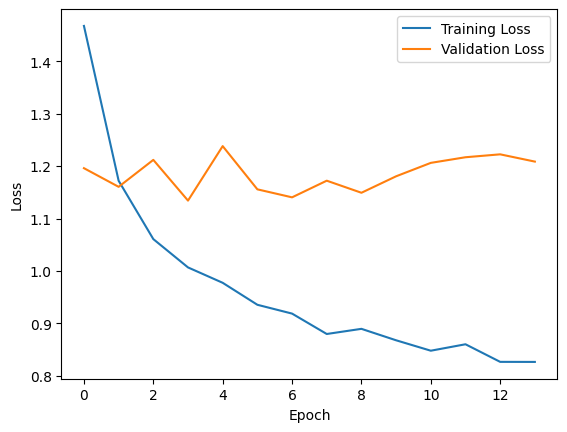

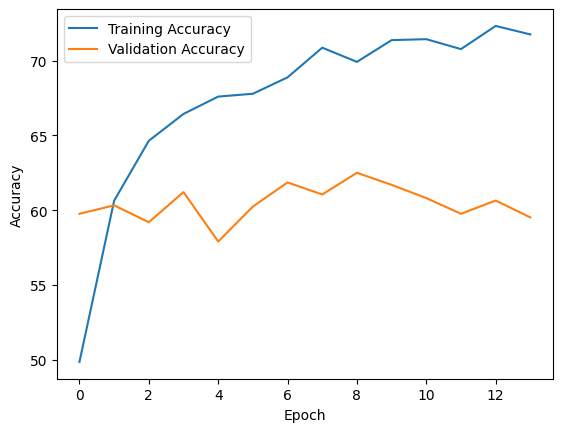

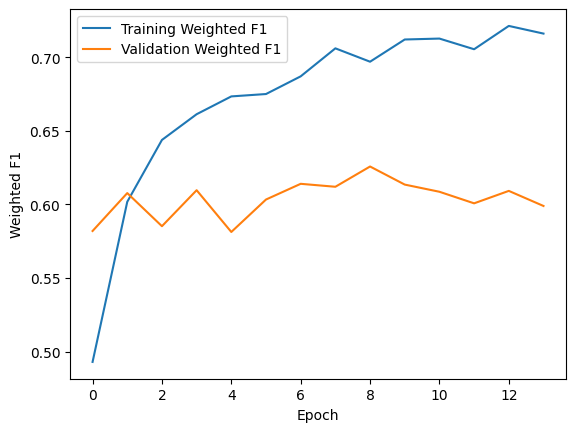

In [149]:
plot_loss(train_losses, test_losses)
plot_metrics(train_accuracies, test_accuracies, 'Accuracy')
plot_metrics(train_f1s, test_f1s, 'Weighted F1')

Реализуем устранение дисбаланса путем прямого оверсемплинга с рейтом 1

In [150]:
transform = v2.Compose([ 
    v2.Resize((224, 224)),
    v2.AutoAugment(v2.AutoAugmentPolicy.IMAGENET),
    v2.RandAugment(),
    GridMask(p=0.5),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [151]:
x_over, y_over = get_oversampled_data(x_train, y_train, idx_to_class, 1)

In [152]:
check_counts(x_over, y_over, idx_to_class)

{'classical': 1895,
 'country': 1895,
 'anime': 1895,
 'disco': 1895,
 'edm': 1895,
 'jazz': 1895,
 'reggae': 1895,
 'black metal': 1895,
 'pop': 1895,
 'rap': 1895}

In [153]:
trainset = GenresDataset(indices=x_over, 
                         classes=y_over,
                         root_dir=PATH,
                         transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                      shuffle=True, num_workers=4)

validset = GenresDataset(indices=x_valid, 
                         classes=y_valid,
                         root_dir=PATH,
                         transform=transform_base)
validloader = torch.utils.data.DataLoader(validset, batch_size=128,
                                          shuffle=True, num_workers=4)

Зафиксируем условия эксперимента

In [154]:
experimet_description = {
    'trainloader': trainloader, 
    'validloader': validloader,
    'descrition': 'Полная классификация. 100% данных. Кастомный оверсемплинг (рейт 0). Случайная автоаугментация и GridMask изображений',
    'criterion': 'nn.CrossEntropyLoss()',
    'optimizer': 'optim.Adam(model.parameters(), lr=0.005)',
    'model': "torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')",
    'model.fc': 'nn.Linear(num_features, num_classes)',
    'transform': transform,
}
dirname = create_dir(experimet_description, type='nn')

Сформируем модель

In [155]:
model = torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, num_classes)
for param in model.parameters():
    param.requires_grad = False
for param in model.fc.parameters():
    param.requires_grad = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.005)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


In [156]:
%%time

num_epochs = 200
model, \
train_losses, train_accuracies, train_f1s, \
test_losses, test_accuracies, test_f1s = train_epochs(
    model, 
    trainloader, 
    validloader, 
    criterion, 
    optimizer, 
    device,
    num_epochs,
    early_stopping_patience=5,
    path=dirname
)

The path is /kaggle/working/nn/04_30_24_23_54_57/
Epoch 1/200


100%|██████████| 10/10 [00:05<00:00,  1.98it/s]


Train Loss: 1.3262 - Train Accuracy: 55.45% - Train F1: 0.5495
Valid Loss: 1.2331 - Valid Accuracy: 58.79% - Valid F1: 0.5969

Epoch 2/200


100%|██████████| 10/10 [00:04<00:00,  2.04it/s]


Train Loss: 1.0280 - Train Accuracy: 65.65% - Train F1: 0.6536
Valid Loss: 1.1822 - Valid Accuracy: 60.08% - Valid F1: 0.6091

Epoch 3/200


100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


Train Loss: 0.9348 - Train Accuracy: 68.30% - Train F1: 0.6804
Valid Loss: 1.1489 - Valid Accuracy: 60.97% - Valid F1: 0.6076

Epoch 4/200


100%|██████████| 10/10 [00:05<00:00,  1.94it/s]


Train Loss: 0.8917 - Train Accuracy: 70.18% - Train F1: 0.6997
Valid Loss: 1.1869 - Valid Accuracy: 60.89% - Valid F1: 0.6085

Epoch 5/200


100%|██████████| 10/10 [00:04<00:00,  2.02it/s]


Train Loss: 0.8660 - Train Accuracy: 71.05% - Train F1: 0.7086
Valid Loss: 1.2003 - Valid Accuracy: 60.32% - Valid F1: 0.6027

Epoch 6/200


100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


Train Loss: 0.8273 - Train Accuracy: 71.90% - Train F1: 0.7175
Valid Loss: 1.3201 - Valid Accuracy: 57.18% - Valid F1: 0.5840

Epoch 7/200


100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


Train Loss: 0.8184 - Train Accuracy: 72.83% - Train F1: 0.7269
Valid Loss: 1.2507 - Valid Accuracy: 60.65% - Valid F1: 0.6117

Epoch 8/200


100%|██████████| 10/10 [00:05<00:00,  1.94it/s]


Train Loss: 0.8122 - Train Accuracy: 72.55% - Train F1: 0.7241
Valid Loss: 1.2367 - Valid Accuracy: 60.40% - Valid F1: 0.6036

Epoch 9/200


100%|██████████| 10/10 [00:05<00:00,  1.95it/s]


Train Loss: 0.7999 - Train Accuracy: 72.97% - Train F1: 0.7285
Valid Loss: 1.2718 - Valid Accuracy: 59.19% - Valid F1: 0.5936

Epoch 10/200


100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


Train Loss: 0.7892 - Train Accuracy: 73.81% - Train F1: 0.7362
Valid Loss: 1.2730 - Valid Accuracy: 58.87% - Valid F1: 0.5871

Epoch 11/200


100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


Train Loss: 0.7841 - Train Accuracy: 73.59% - Train F1: 0.7347
Valid Loss: 1.2651 - Valid Accuracy: 60.24% - Valid F1: 0.6032

Epoch 12/200


100%|██████████| 10/10 [00:04<00:00,  2.03it/s]


Train Loss: 0.7759 - Train Accuracy: 73.73% - Train F1: 0.7361
Valid Loss: 1.3182 - Valid Accuracy: 60.00% - Valid F1: 0.6016

Early stopping triggered: no improvement in test F1 score for 5 epochs.
The best epoch is #7
The best model is saved
The best weighed F1 score equals 0.6117469582336769
CPU times: user 6min 26s, sys: 49.9 s, total: 7min 16s
Wall time: 16min 57s


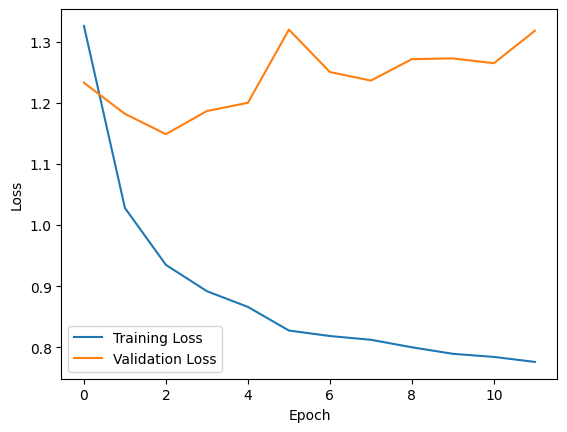

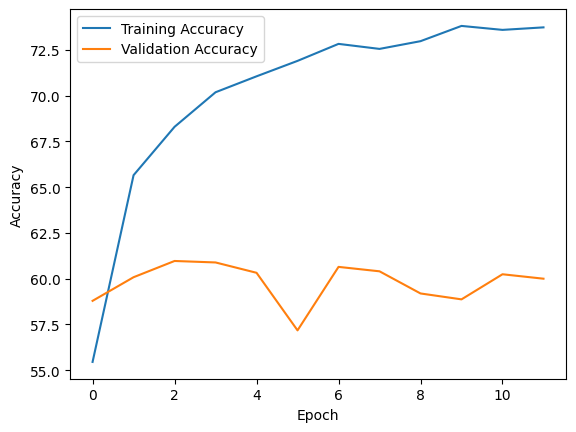

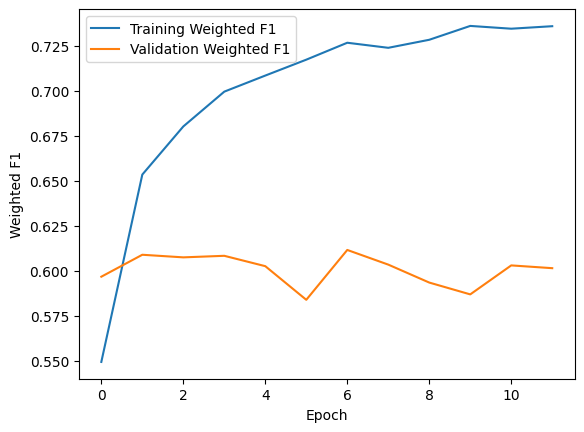

In [157]:
plot_loss(train_losses, test_losses)
plot_metrics(train_accuracies, test_accuracies, 'Accuracy')
plot_metrics(train_f1s, test_f1s, 'Weighted F1')

Реализуем устранение дисбаланса путем прямого оверсемплинга с рейтом 5

In [158]:
transform = v2.Compose([ 
    v2.Resize((224, 224)),
    v2.AutoAugment(v2.AutoAugmentPolicy.IMAGENET),
    v2.RandAugment(),
    GridMask(p=0.5),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [159]:
x_over, y_over = get_oversampled_data(x_train, y_train, idx_to_class, 5)

In [160]:
check_counts(x_over, y_over, idx_to_class)

{'classical': 5687,
 'country': 5687,
 'anime': 5687,
 'disco': 5687,
 'edm': 5687,
 'jazz': 5687,
 'reggae': 5687,
 'black metal': 5687,
 'pop': 5687,
 'rap': 5687}

In [161]:
trainset = GenresDataset(indices=x_over, 
                         classes=y_over,
                         root_dir=PATH,
                         transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                      shuffle=True, num_workers=4)

validset = GenresDataset(indices=x_valid, 
                         classes=y_valid,
                         root_dir=PATH,
                         transform=transform_base)
validloader = torch.utils.data.DataLoader(validset, batch_size=128,
                                          shuffle=True, num_workers=4)

Зафиксируем условия эксперимента

In [162]:
experimet_description = {
    'trainloader': trainloader, 
    'validloader': validloader,
    'descrition': 'Полная классификация. 100% данных. Кастомный оверсемплинг (рейт 5). Случайная автоаугментация и GridMask изображений',
    'criterion': 'nn.CrossEntropyLoss()',
    'optimizer': 'optim.Adam(model.parameters(), lr=0.005)',
    'model': "torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')",
    'model.fc': 'nn.Linear(num_features, num_classes)',
    'transform': transform,
}
dirname = create_dir(experimet_description, type='nn')

Сформируем модель

In [163]:
model = torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, num_classes)
for param in model.parameters():
    param.requires_grad = False
for param in model.fc.parameters():
    param.requires_grad = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.005)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


In [164]:
%%time

num_epochs = 200
model, \
train_losses, train_accuracies, train_f1s, \
test_losses, test_accuracies, test_f1s = train_epochs(
    model, 
    trainloader, 
    validloader, 
    criterion, 
    optimizer, 
    device,
    num_epochs,
    early_stopping_patience=5,
    path=dirname
)

The path is /kaggle/working/nn/05_01_24_00_11_58/
Epoch 1/200


100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


Train Loss: 1.0811 - Train Accuracy: 63.88% - Train F1: 0.6355
Valid Loss: 1.1788 - Valid Accuracy: 60.65% - Valid F1: 0.6089

Epoch 2/200


100%|██████████| 10/10 [00:04<00:00,  2.04it/s]


Train Loss: 0.8544 - Train Accuracy: 71.10% - Train F1: 0.7091
Valid Loss: 1.2477 - Valid Accuracy: 61.05% - Valid F1: 0.6130

Epoch 3/200


100%|██████████| 10/10 [00:04<00:00,  2.08it/s]


Train Loss: 0.8035 - Train Accuracy: 72.80% - Train F1: 0.7265
Valid Loss: 1.2734 - Valid Accuracy: 59.52% - Valid F1: 0.6000

Epoch 4/200


100%|██████████| 10/10 [00:04<00:00,  2.07it/s]


Train Loss: 0.7851 - Train Accuracy: 73.55% - Train F1: 0.7342
Valid Loss: 1.2918 - Valid Accuracy: 59.76% - Valid F1: 0.5981

Epoch 5/200


100%|██████████| 10/10 [00:04<00:00,  2.04it/s]


Train Loss: 0.7710 - Train Accuracy: 74.10% - Train F1: 0.7397
Valid Loss: 1.3384 - Valid Accuracy: 59.03% - Valid F1: 0.5985

Epoch 6/200


100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


Train Loss: 0.7684 - Train Accuracy: 74.40% - Train F1: 0.7428
Valid Loss: 1.3622 - Valid Accuracy: 59.35% - Valid F1: 0.5908

Epoch 7/200


100%|██████████| 10/10 [00:04<00:00,  2.03it/s]


Train Loss: 0.7541 - Train Accuracy: 74.61% - Train F1: 0.7450
Valid Loss: 1.3632 - Valid Accuracy: 59.19% - Valid F1: 0.5931

Early stopping triggered: no improvement in test F1 score for 5 epochs.
The best epoch is #2
The best model is saved
The best weighed F1 score equals 0.6129616354035858
CPU times: user 10min 48s, sys: 1min 22s, total: 12min 10s
Wall time: 28min 21s


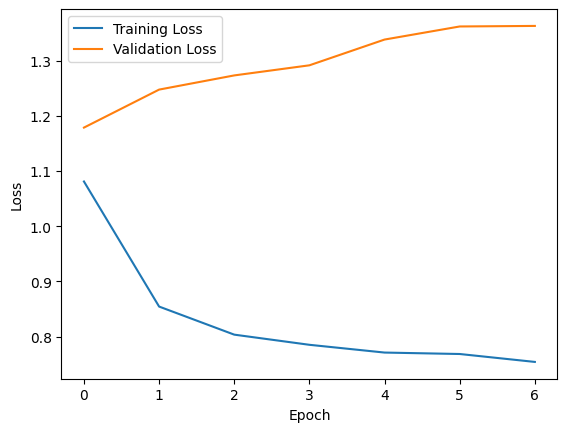

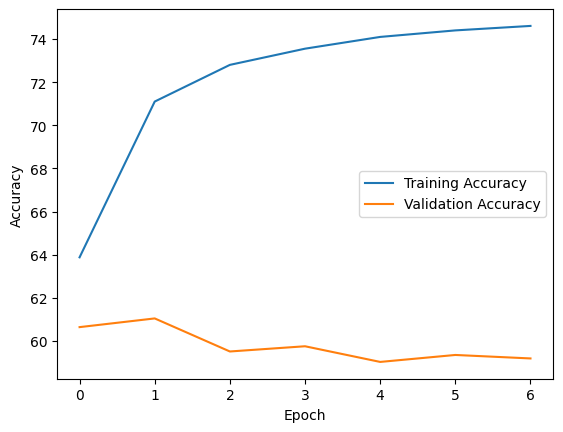

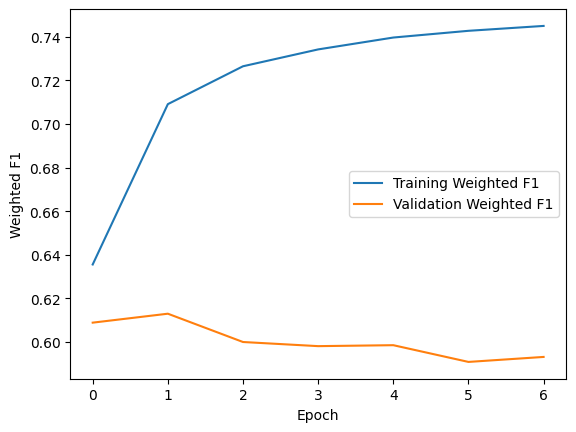

In [165]:
plot_loss(train_losses, test_losses)
plot_metrics(train_accuracies, test_accuracies, 'Accuracy')
plot_metrics(train_f1s, test_f1s, 'Weighted F1')

### Оценка качества итоговой модели на тестовых данных

В результате проведенной работы были обучены 5 вариантов моделей на основе ResNet50 со следующими базовыми параметрами:
- функция потерь - nn.CrossEntropyLoss()
- оптимизатор - optim.Adam(model.parameters(), lr=0.005)
- модель - torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')
- новый классификационный слой - nn.Linear(2048, 10)

Итоговые результаты:
- базовые параметры: weighed F1 = 0.6269
- простая аугментация изображений: weighed F1 = 0.6319
- случайная аугментация изображений: weighed F1 = 0.6208
- применение кастомной аугментации изображений (GridMask): weighed F1 = 0.6213
- устранение дисбаланса классов:
    - взвешивание классов: weighed F1 = 0,6145
    - применение WeightedRandomSampler: weighed F1 = 0,6150
    - кастомный оверсемплинг: weighed F1 = 0,6257
    - кастомный оверсемплинг с копированием данных в 2 раза: weighed F1 = 0,6117
    - кастомный оверсемплинг с копированием данных в 5 раз: weighed F1 = 0,6130
 
Исходя из результатов обучения нейросети попробуем оценить качество предсказаний с использованием матрицы ошибок модели на тестовой выборке.

In [95]:
model_final_dict = torch.load('/kaggle/working/nn/05_02_24_03_20_15/model_epoch_10_0.6319.pth')
final_experiment_description = torch.load('/kaggle/working/nn/05_02_24_03_20_15/initial_content.pth')
model_final_variables = torch.load('/kaggle/working/nn/05_02_24_03_20_15/variables_epoch_10_0.6319.pth')

In [96]:
model_final = torch.hub.load('pytorch/vision', 'resnet50', weights='DEFAULT')
num_features = model_final.fc.in_features
model_final.fc = nn.Linear(num_features, num_classes)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_final = model_final.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.005)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


In [97]:
model_final.load_state_dict(model_final_dict)

<All keys matched successfully>

In [120]:
all_predictions = np.empty(0)
all_labels = np.empty(0)

model_final.eval()

with torch.no_grad():
    for inputs, labels in tqdm(testloader):
        labels = labels.type(torch.LongTensor)
        inputs, labels = inputs.to(device), labels.to(device)

        outputs = model(inputs)
        loss = criterion(outputs, labels)

        test_loss += loss.item() * inputs.size(0)

        _, predicted = torch.max(outputs, 1)
        
        all_predictions = np.append(all_predictions, 
                                    predicted.cpu().numpy())
        all_labels = np.append(all_labels, labels.cpu().numpy())

100%|██████████| 13/13 [00:06<00:00,  1.97it/s]


Оценим контролируемую метрику

In [121]:
weighted_f1_score = f1_score(all_labels, 
                             all_predictions, 
                             average='weighted')
weighted_f1_score

0.6051096138836909

Результат не очень высокий, но и порядка валидационный выборки. Модель не переобучилась.

Оценим предсказания модели с использованием материцы ошибок

In [138]:
class_names = list(idx_to_class.values())

In [137]:
cm = confusion_matrix(all_labels, all_predictions)

In [ ]:
{'baseline', 'bottom', 'center', 'center_baseline', 'top'}
{'left', 'center', 'right'}

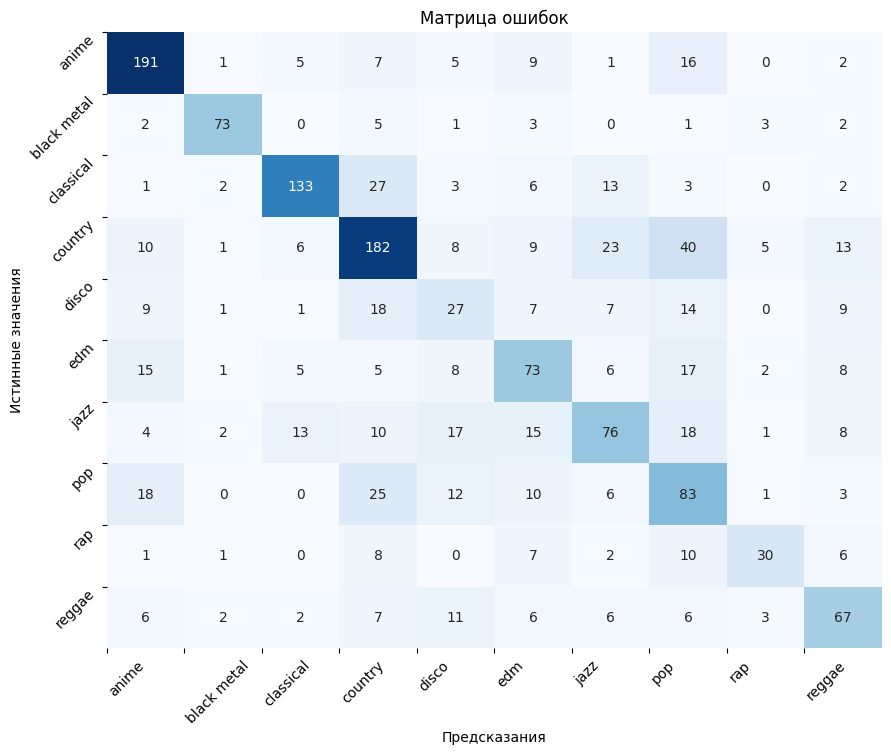

In [163]:
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel('Предсказания')
plt.ylabel('Истинные значения')
plt.title('Матрица ошибок')
plt.xticks(ticks=np.arange(len(class_names)), labels=class_names, rotation=45, ha='left')
plt.yticks(ticks=np.arange(len(class_names)), labels=class_names, rotation=45, va='top', ha='right')
plt.show()
plt.show()

Сформируем нормализованную матрицу ошибок

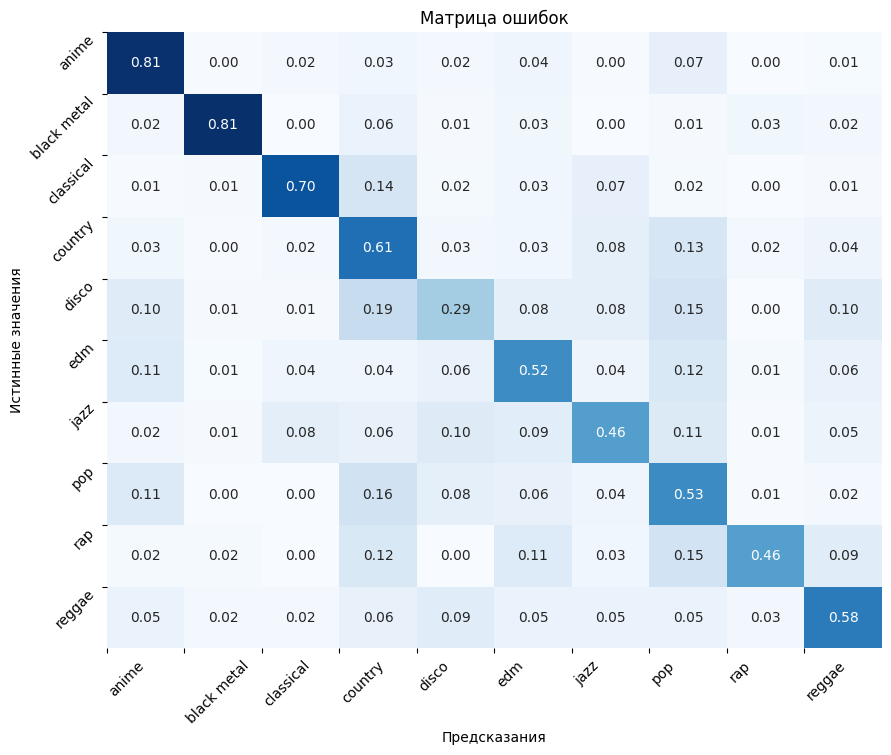

In [164]:
cmn = confusion_matrix(all_labels, all_predictions, normalize='true')
plt.figure(figsize=(10, 8))
sns.heatmap(cmn, annot=True, fmt=".2f", cmap="Blues", cbar=False)
plt.xlabel('Предсказания')
plt.ylabel('Истинные значения')
plt.xticks(ticks=np.arange(len(class_names)), labels=class_names, rotation=45, ha='left')
plt.yticks(ticks=np.arange(len(class_names)), labels=class_names, rotation=45, va='top', ha='right')
plt.title('Матрица ошибок')
plt.show()

На основании матрицы ошибок мы видим, что некоторые классы, в частности, anime и black_metal различаются в большой части случаев. 

В то же время, альбомы жанра disco очень часто классифицируются неверно (в 71% случаев). Зачастую данный класс путается с county (в 19% случаев), pop (в 15% случаев) и даже anime (в 10% случаев).

При этом, следует отметить, что обложки альбомов diso, ed, pop и rap нередко сложно отличись даже человеку.

Однако увеличить качество модели реально.

## Итоговый вывод

В ходе работы были выполнены запланированные шаги и достигнуты следующие результаты.

**А. Изучены данные и проведена предобработка данных**

В ходе изучения входных данных был выполнен анализ каталога с изображениями и выявлено:

Имеется 10 классов-жанров музукальных альбомов: 'anime', 'black metal', 'classical', 'country', 'disco', 'edm', 'jazz', 'pop', 'rap', 'reggae'.
Общее количество изображений обложек альбомов - 7800.
Максимальное количество изображений в классе 'country' (1485, 19.04%), минимальное - 'rap' (327, 4.19%).
Имеется дисбаланс классов. Однако в масштабе общей выборки он не значителен. В рамках работы попробуем его устранить и оценим его влияние на обучение моделей.
Изображения, в целом, позволяют различить жанры альбомов человеку. Однако, классы 'country', 'disco' и 'pop' могут иметь схожие цветовые гаммы и трудноразличимы. Класс 'black metal', наверняка, будет различим. Возможно, данный фактор негативно скажется на качестве классификации.
Все изображения одного размера - 300x300. Изменения размера на данном этапе не целесообразно.
Целесообразно проверить на наличие дубликатов.

В ходе предобработки данных были обнаружены 52 дубликата в полном объеме данных. Желательно удалить эти дубликаты. Удалять их будем при формировании данных для обучения с использованием созданной функции.

В ходе подготовки к моделирования были разработаны функции для разделения данных на тренировочную, валидационную и тестовую выборки в соотношении 60%:20%:20% (по умолчанию).

Для загрузки изображений из каталога реализован класс GenresDataset, который в дальнейшем будет использован в качестве набора данных PyTorch.

Кроме того, для построения бейзлайн модели и поиска дубликатов изображений была разработана функция формирования эмбеддингов изображений на основе предобученной модели ResNet50.

**Б. Разработаны и обучены модели машинного обучения**

В результате анализа целей и задач работы определены условия разработки моделей МО:
- определено, что в работе необходимо решить задачу задача мультиклассовой классификации;
- по условиям задачи все классы одинаково важны, имеется не сильный дисбаланс классов;
- принято решение контролировать метрику - взвешеная F1-мера.


Также был сформирован план основного этапа моделирования:

- сформировать бейзлайн модель с использованием метода ближайших соседей на основании эмбеддингов изображений, полученных через нейросеть ResNet50.
- оценить качество моделей классического ML.
- построить неросеть, оценить ее качество.
- провести эксперементы по улучшению качества нейросети.
- вырать лучшую модель.

Итоги работы:
- бейзлайн модель построена с использованием  библиотеки FAISS. Метрика Weigheted F1 - 0,49.
- модели классического МЛ: SVC - 0.62, RangomForestClassifier - 0.45, CatBoostClassifier - 0.61.
- нейросети на базовых параметрах: weighed F1 = 0.6269
    - простая аугментация изображений: weighed F1 = 0.6319
    - случайная аугментация изображений: weighed F1 = 0.6208
    - применение кастомной аугментации изображений (GridMask): weighed F1 = 0.6213
    - устранение дисбаланса классов: weighed F1 = 0,6257 методом кастомного оверсемплинга.

**В. Оценка качества модели на тестовой выборке**

Исходя из результатов обучения нейросети попробуем оценить качество предсказаний с использованием матрицы ошибок модели на тестовой выборке. Метрика weighed F1 составила 0.601, но и порядка валидационный выборки. Модель не переобучилась. 

Предсказания модели были проанализированы на основании матрицы ошибок. Анализ показал, что некоторые классы, в частности, anime и black_metal различаются в большой части случаев. В то же время, альбомы жанра disco очень часто классифицируются неверно (в 71% случаев). Зачастую данный класс путается с county (в 19% случаев), pop (в 15% случаев) и даже anime (в 10% случаев). 
При этом, следует отметить, что обложки альбомов diso, ed, pop и rap нередко сложно отличись даже человеку.

Предполагается, что качество модели можно улучшить.

**Разработка интефейса взаимодействия клиентов и модели будет произведено позднее. Планируется дальнейшая работа по улучшению ее качества. На текущем этапе работы модель была сохранена.**

**Дальнейшая работа**

С учетом проведенной работы полагается целесообразным осуществить следующую доработку:
1. Расширить данные дополнительными экземплярами классов, устанив дисбаланс классов и увеличив выборки (с использованием MusizBrainz API и Spotify API).
2. Провести кластеризацию изображений с целью выявления трудноразличимых классов, попытаться дополнительными преобразованиями увеличить "расстояние" между ними.
3. Выделить из изображений дополнительные признаки, например:
    - наличие лица на изображении;
    - наличие человека на изображении;
    - наличие группы людей на изображении;
    - стиль изображения (мультипликация, фото и др.);
    - оценку структуры изображения;
    - оценку цвета изображения;
    - оценку текстуры изображения.
4. Применит новые признаки в комбинации с изображением: встроить в нейросеть или использовать эмбеддинги. Возможно с понижением размерности.
5. Разработать интрефейс взаимодействия клиентов и модели (раширить класс для полной проверки на валидность и отображения характеристик автомобилей).
6. Реализовать веб-приложение, демонстрирующее работу модели. Например, с использованием streamlit.